In [1]:
# Importing packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

In [2]:
# Configuring default setting to display all the rows and columns
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [3]:
# loading dataset
transaction = pd.read_excel('KPMG_VI_New_raw_data_update_final.xlsx', sheet_name='Transactions', header=1)
demographic = pd.read_excel('KPMG_VI_New_raw_data_update_final.xlsx', sheet_name='CustomerDemographic', header=1)
address = pd.read_excel('KPMG_VI_New_raw_data_update_final.xlsx', sheet_name='CustomerAddress', header=1)
New_customer = pd.read_excel('KPMG_VI_New_raw_data_update_final.xlsx', sheet_name='NewCustomerList', header=1)

In [4]:
# visualise data set
transaction.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date
0,1,2,2950,2017-02-25,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,41245.0
1,2,3,3120,2017-05-21,1.0,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,41701.0
2,3,37,402,2017-10-16,0.0,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,36361.0
3,4,88,3135,2017-08-31,0.0,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.10,36145.0
4,5,78,787,2017-10-01,1.0,Approved,Giant Bicycles,Standard,medium,large,1765.30,709.48,42226.0


In [5]:
# visualise data set
demographic.head()

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,default,owns_car,tenure
0,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,"""'",Yes,11.0
1,2,Eli,Bockman,Male,81,1980-12-16,Administrative Officer,Financial Services,Mass Customer,N,<script>alert('hi')</script>,Yes,16.0
2,3,Arlin,Dearle,Male,61,1954-01-20,Recruiting Manager,Property,Mass Customer,N,2018-02-01 00:00:00,Yes,15.0
3,4,Talbot,NaN,Male,33,1961-10-03,NaN,IT,Mass Customer,N,() { _; } >_[$($())] { touch /tmp/blns.shellsh...,No,7.0
4,5,Sheila-kathryn,Calton,Female,56,1977-05-13,Senior Editor,NaN,Affluent Customer,N,NIL,Yes,8.0


In [6]:
# visualise data set
address.head()

,customer_id,address,postcode,state,country,property_valuation
0,1,060 Morning Avenue,2016,New South Wales,Australia,10
1,2,6 Meadow Vale Court,2153,New South Wales,Australia,10
2,4,0 Holy Cross Court,4211,QLD,Australia,9
3,5,17979 Del Mar Point,2448,New South Wales,Australia,4
4,6,9 Oakridge Court,3216,VIC,Australia,9


In [7]:
# visualise data set
New_customer.head()

,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,address,postcode,state,country,property_valuation,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Rank,Value
0,Chickie,Brister,Male,86,1957-07-12,General Manager,Manufacturing,Mass Customer,N,Yes,14,45 Shopko Center,4500,QLD,Australia,6,0.56,0.7000,0.8750,0.743750,1,1,1.718750
1,Morly,Genery,Male,69,1970-03-22,Structural Engineer,Property,Mass Customer,N,No,16,14 Mccormick Park,2113,NSW,Australia,11,0.89,0.8900,1.1125,0.945625,1,1,1.718750
2,Ardelis,Forrester,Female,10,1974-08-28,Senior Cost Accountant,Financial Services,Affluent Customer,N,No,10,5 Colorado Crossing,3505,VIC,Australia,5,1.01,1.0100,1.0100,1.010000,1,1,1.718750
3,Lucine,Stutt,Female,64,1979-01-28,Account Representative III,Manufacturing,Affluent Customer,N,Yes,5,207 Annamark Plaza,4814,QLD,Australia,1,0.87,1.0875,1.0875,1.087500,4,4,1.703125
4,Melinda,Hadlee,Female,34,1965-09-21,Financial Analyst,Financial Services,Affluent Customer,N,No,19,115 Montana Place,2093,NSW,Australia,9,0.52,0.5200,0.6500,0.650000,4,4,1.703125


## Merging all 3 dataset into one

In [8]:
df = pd.merge(demographic, transaction, how='inner', on='customer_id')
df = pd.merge(df, address, how= 'inner', on='customer_id')
df.head()

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,default,owns_car,tenure,transaction_id,product_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,address,postcode,state,country,property_valuation
0,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,"""'",Yes,11.0,94,86,2017-12-23,0.0,Approved,OHM Cycles,Standard,medium,medium,235.63,125.07,38482.0,060 Morning Avenue,2016,New South Wales,Australia,10
1,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,"""'",Yes,11.0,3765,38,2017-04-06,1.0,Approved,Solex,Standard,medium,medium,1577.53,826.51,39526.0,060 Morning Avenue,2016,New South Wales,Australia,10
2,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,"""'",Yes,11.0,5157,47,2017-05-11,1.0,Approved,Trek Bicycles,Road,low,small,1720.70,1531.42,37823.0,060 Morning Avenue,2016,New South Wales,Australia,10
3,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,"""'",Yes,11.0,9785,72,2017-01-05,0.0,Approved,Norco Bicycles,Standard,medium,medium,360.40,270.30,37873.0,060 Morning Avenue,2016,New South Wales,Australia,10
4,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,"""'",Yes,11.0,13424,2,2017-02-21,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,38573.0,060 Morning Avenue,2016,New South Wales,Australia,10


## Independent and dependent variables

In [9]:
# Separating target variable from independent variable  
target_columns = [var for var in df.columns if var not in New_customer.columns]
target_columns

['customer_id',
 'default',
 'transaction_id',
 'product_id',
 'transaction_date',
 'online_order',
 'order_status',
 'brand',
 'product_line',
 'product_class',
 'product_size',
 'list_price',
 'standard_cost',
 'product_first_sold_date']

In [10]:
# independent variables 
independent_attribute = [var for var in df.columns if var not in target_columns]
independent_attribute

['first_name',
 'last_name',
 'gender',
 'past_3_years_bike_related_purchases',
 'DOB',
 'job_title',
 'job_industry_category',
 'wealth_segment',
 'deceased_indicator',
 'owns_car',
 'tenure',
 'address',
 'postcode',
 'state',
 'country',
 'property_valuation']

## Missing values imputation

In [11]:
# Percentage of missing values in the independent variables 
df[independent_attribute].isnull().mean()*100

first_name                              0.000000
last_name                               3.215144
gender                                  0.000000
past_3_years_bike_related_purchases     0.000000
DOB                                     2.233574
job_title                              11.914062
job_industry_category                  16.135817
wealth_segment                          0.000000
deceased_indicator                      0.000000
owns_car                                0.000000
tenure                                  2.233574
address                                 0.000000
postcode                                0.000000
state                                   0.000000
country                                 0.000000
property_valuation                      0.000000
dtype: float64

In [12]:
missing_values = [var for var in independent_attribute if df[var].isnull().any()]
missing_values

['last_name', 'DOB', 'job_title', 'job_industry_category', 'tenure']

The missing values in the above variables can be imputed as they are independent variables.   
Let's see the correlation among independent varaibles containing missing values

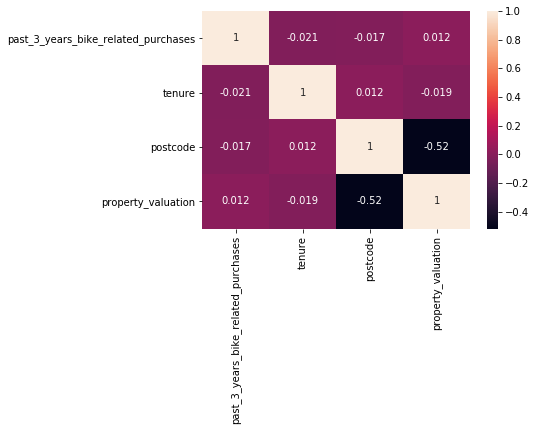

In [13]:
sns.heatmap(df[independent_attribute].corr(), annot=True)

We not able to find any correlation between tenure columns and other independent columns.  
Let's feature extract age from DOB columns to see any casual relationship

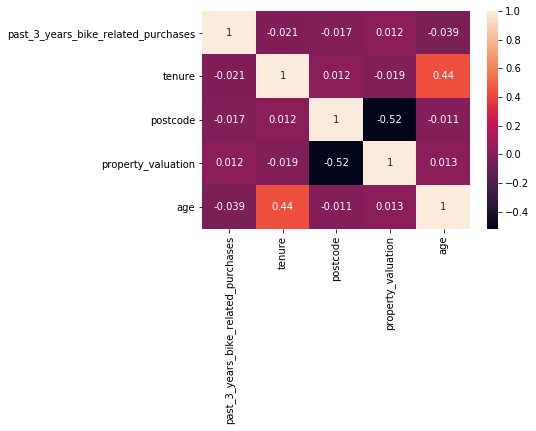

In [14]:
df['birth_year'] = pd.DatetimeIndex(df.DOB).year
df['age'] = 2020-df['birth_year']
independent_attribute.append('age')
sns.heatmap(df[independent_attribute].corr(), annot=True)

We can see some relation between age and tenure

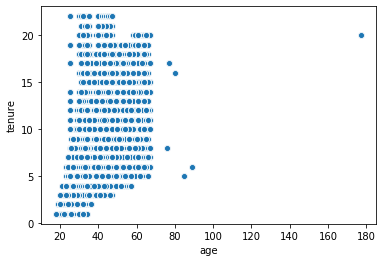

In [15]:
sns.scatterplot(df.age, df.tenure)

In [16]:
print('No of records missing in tenure',df[df.tenure.isnull()].shape[0])
print('No of records missing in age',df[df.age.isnull()].shape[0])
print('No of records missing in both age and tenure',df[df.tenure.isnull() & df.age.isnull()].shape[0])

No of records missing in tenure 446
No of records missing in age 446
No of records missing in both age and tenure 446


In [17]:
# replacing missing values in age and tenure columns with 0
def fill_num(data, list):
    for var in list:
        data[var] = data[var].fillna(0)
        
fill_num(df, ['tenure', 'age'])

Since the percentage of missing data is high in columns job_title and job_industry_category. So we have to put an indicator of missing values so that we can preserve valuable information. 

In [18]:
# replacing missing values in job_title and job_industry_category columns with 'missing' label
def fill_cat(data, list):
    for var in list:
        data[var] = data[var].fillna('missing')
        
fill_cat(df, ['job_title', 'job_industry_category'])

In [19]:
# Percentage of missing values in the target variables 
df[target_columns].isnull().mean()*100

customer_id                0.000000
default                    7.266627
transaction_id             0.000000
product_id                 0.000000
transaction_date           0.000000
online_order               1.797877
order_status               0.000000
brand                      0.976562
product_line               0.976562
product_class              0.976562
product_size               0.976562
list_price                 0.000000
standard_cost              0.976562
product_first_sold_date    0.976562
dtype: float64

Now before deleting the records having missing values. We have to drop out default column because:  
1. The values are un explainable
2. The missing values contained is 7.27 percentage which is greater than missing data percentage present in DOB column.

In [20]:
df.drop('default', axis=1, inplace=True)
target_columns = target_columns[2:]
df.columns

Index(['customer_id', 'first_name', 'last_name', 'gender',
       'past_3_years_bike_related_purchases', 'DOB', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'transaction_id', 'product_id',
       'transaction_date', 'online_order', 'order_status', 'brand',
       'product_line', 'product_class', 'product_size', 'list_price',
       'standard_cost', 'product_first_sold_date', 'address', 'postcode',
       'state', 'country', 'property_valuation', 'birth_year', 'age'],
      dtype='object')

In [21]:
# Droping records which is having missing values in target variables
df = df.dropna(axis=0, subset=target_columns)
df[target_columns].isnull().any()

transaction_id             False
product_id                 False
transaction_date           False
online_order               False
order_status               False
brand                      False
product_line               False
product_class              False
product_size               False
list_price                 False
standard_cost              False
product_first_sold_date    False
dtype: bool

## Feature engineering some of the target columns

In [22]:
target_columns = target_columns[2:]
target_columns

['transaction_date',
 'online_order',
 'order_status',
 'brand',
 'product_line',
 'product_class',
 'product_size',
 'list_price',
 'standard_cost',
 'product_first_sold_date']

In [23]:
df['year'] = pd.DatetimeIndex(df.transaction_date).year
df['month'] = pd.DatetimeIndex(df.transaction_date).month
df['weekday'] = pd.DatetimeIndex(df.transaction_date).weekday

for var in ['year', 'month', 'weekday']:
    target_columns.append(var)
    
df[target_columns].head()

,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,year,month,weekday
0,2017-12-23,0.0,Approved,OHM Cycles,Standard,medium,medium,235.63,125.07,38482.0,2017,12,5
1,2017-04-06,1.0,Approved,Solex,Standard,medium,medium,1577.53,826.51,39526.0,2017,4,3
2,2017-05-11,1.0,Approved,Trek Bicycles,Road,low,small,1720.70,1531.42,37823.0,2017,5,3
3,2017-01-05,0.0,Approved,Norco Bicycles,Standard,medium,medium,360.40,270.30,37873.0,2017,1,3
4,2017-02-21,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,38573.0,2017,2,1


In [24]:
for var in df[target_columns].columns:
    print(var,'->',df[var].nunique())

transaction_date -> 364
online_order -> 2
order_status -> 2
brand -> 6
product_line -> 4
product_class -> 3
product_size -> 3
list_price -> 100
standard_cost -> 100
product_first_sold_date -> 100
year -> 1
month -> 12
weekday -> 7


In [25]:
target_columns = target_columns[1:]
target_columns

['online_order',
 'order_status',
 'brand',
 'product_line',
 'product_class',
 'product_size',
 'list_price',
 'standard_cost',
 'product_first_sold_date',
 'year',
 'month',
 'weekday']

In [26]:
target_columns = ['online_order',
 'order_status',
 'brand',
 'product_line',
 'product_class',
 'product_size',
 'list_price',
 'standard_cost',
 'product_first_sold_date',
 'month',
 'weekday']

In [27]:
target_num = [var for var in target_columns if df[var].dtypes != 'object']
target_cat = [var for var in target_columns if df[var].dtypes == 'object']

target_num, target_cat

(['online_order',
  'list_price',
  'standard_cost',
  'product_first_sold_date',
  'month',
  'weekday'],
 ['order_status', 'brand', 'product_line', 'product_class', 'product_size'])

## Independent Numeric variables

In [28]:
num_indp_var = [var for var in independent_attribute if df[var].dtypes != 'object']
num_indp_var

['past_3_years_bike_related_purchases',
 'DOB',
 'tenure',
 'postcode',
 'property_valuation',
 'age']

In [29]:
num_indp_var = ['past_3_years_bike_related_purchases',
 'tenure',
 'postcode',
 'property_valuation',
 'age']

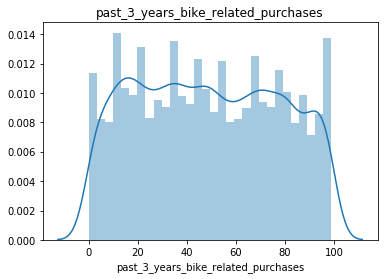

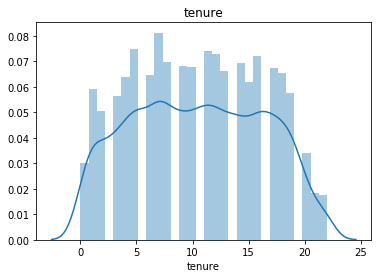

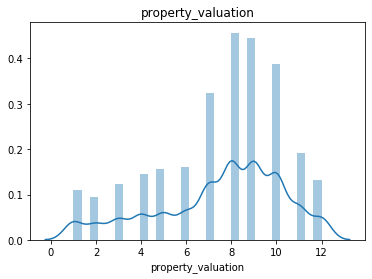

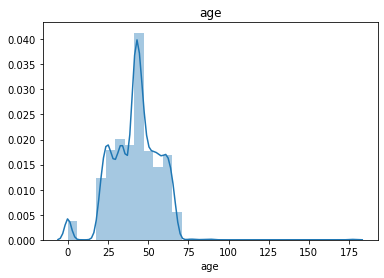

In [30]:
# Distribution of numeric varaibles 
for var in ['past_3_years_bike_related_purchases', 'tenure', 'property_valuation', 'age']:
    sns.distplot(df[var], bins=30)
    plt.title(var)
    plt.show()

* property_valuation distribution is slightly negative skewed
* We have an outlier in age column and the distribution is positive skewed

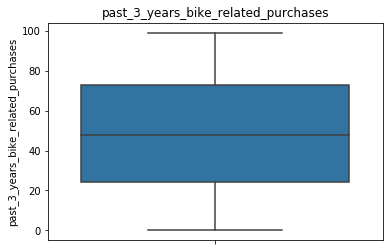

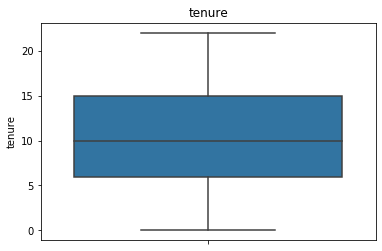

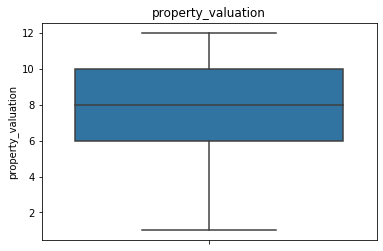

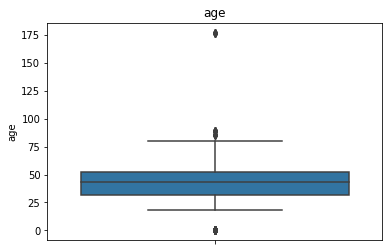

In [31]:
# Boxplot of numeric varaibles 
for var in ['past_3_years_bike_related_purchases', 'tenure', 'property_valuation', 'age']:
    sns.boxplot(y = df[var])
    plt.title(var)
    plt.show()

As aspected, age column is showing an outlier.  
Need to deal with an outlier

In [32]:
# outlier in age column
df[df.age > 100]

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,transaction_id,product_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,address,postcode,state,country,property_valuation,birth_year,age,year,month,weekday
171,34,Jephthah,Bachmann,U,59,1843-12-21,Legal Assistant,IT,Affluent Customer,N,No,20.0,1039,8,2017-07-01,1.0,Approved,Solex,Road,medium,small,1703.52,1516.13,40649.0,833 Luster Way,4005,QLD,Australia,8,1843.0,177.0,2017,7,5
172,34,Jephthah,Bachmann,U,59,1843-12-21,Legal Assistant,IT,Affluent Customer,N,No,20.0,1107,15,2017-08-22,0.0,Approved,Norco Bicycles,Standard,low,medium,958.74,748.90,38693.0,833 Luster Way,4005,QLD,Australia,8,1843.0,177.0,2017,8,1
173,34,Jephthah,Bachmann,U,59,1843-12-21,Legal Assistant,IT,Affluent Customer,N,No,20.0,2638,83,2017-04-07,0.0,Approved,Solex,Touring,medium,large,2083.94,675.03,41533.0,833 Luster Way,4005,QLD,Australia,8,1843.0,177.0,2017,4,4
174,34,Jephthah,Bachmann,U,59,1843-12-21,Legal Assistant,IT,Affluent Customer,N,No,20.0,9044,12,2017-02-13,0.0,Approved,WeareA2B,Standard,medium,medium,1231.15,161.60,38216.0,833 Luster Way,4005,QLD,Australia,8,1843.0,177.0,2017,2,0
175,34,Jephthah,Bachmann,U,59,1843-12-21,Legal Assistant,IT,Affluent Customer,N,No,20.0,9792,60,2017-06-25,1.0,Approved,Giant Bicycles,Standard,high,small,1977.36,1759.85,40779.0,833 Luster Way,4005,QLD,Australia,8,1843.0,177.0,2017,6,6
176,34,Jephthah,Bachmann,U,59,1843-12-21,Legal Assistant,IT,Affluent Customer,N,No,20.0,12083,13,2017-07-23,0.0,Approved,Solex,Standard,medium,medium,1163.89,589.27,42560.0,833 Luster Way,4005,QLD,Australia,8,1843.0,177.0,2017,7,6
178,34,Jephthah,Bachmann,U,59,1843-12-21,Legal Assistant,IT,Affluent Customer,N,No,20.0,17808,96,2017-04-10,1.0,Approved,WeareA2B,Road,low,small,1172.78,1043.77,37539.0,833 Luster Way,4005,QLD,Australia,8,1843.0,177.0,2017,4,0
179,34,Jephthah,Bachmann,U,59,1843-12-21,Legal Assistant,IT,Affluent Customer,N,No,20.0,19291,65,2017-09-19,0.0,Approved,WeareA2B,Standard,medium,medium,1807.45,778.69,42145.0,833 Luster Way,4005,QLD,Australia,8,1843.0,177.0,2017,9,1


In [33]:
df.groupby('property_valuation')['age'].mean()

property_valuation
1     42.402299
2     41.343844
3     41.308219
4     42.092308
5     41.359206
6     40.784588
7     41.792535
8     42.178154
9     42.970069
10    40.887722
11    43.342105
12    41.795551
Name: age, dtype: float64

In [34]:
age = df.groupby('property_valuation')['age'].mean()[8].round()
age

42.0

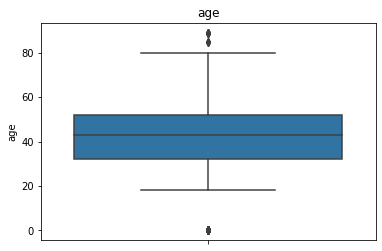

In [35]:
df['age'] = np.where(df['age'] == 177, age, df['age'])
sns.boxplot(y = df['age'])
plt.title('age')
plt.show()

In [36]:
variables = print('numeric independent variable:', num_indp_var, '\n',
                  'target categorical variable:', target_cat, '\n',
                  'target numeric variable:', target_num)

numeric independent variable: ['past_3_years_bike_related_purchases', 'tenure', 'postcode', 'property_valuation', 'age'] 
 target categorical variable: ['order_status', 'brand', 'product_line', 'product_class', 'product_size'] 
 target numeric variable: ['online_order', 'list_price', 'standard_cost', 'product_first_sold_date', 'month', 'weekday']


In [37]:
def indepNum_targetCat_compare(num_var, cat_var, df):
    print(str(num_var)+' vs '+str(cat_var))
    
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize = (15,4))
    
    # Mean
    chart1 = sns.barplot(x=df[cat_var], y=df[num_var], ax = axes[0])
    chart1.set_title('Mean')
    chart1.set_xticklabels(chart1.get_xticklabels(), rotation = 45)
    
    # Median
    index = df.groupby(cat_var)[num_var].median().index
    values = df.groupby(cat_var)[num_var].median().values
    chart2 = sns.barplot(x=index, y=values, ax=axes[1])
    chart2.set_title('Median')
    chart2.set_xticklabels(chart1.get_xticklabels(), rotation = 45)
    
    # Count
    chart3 = sns.countplot(df[cat_var], ax = axes[2])
    chart3.set_title('Count')
    chart3.set_xticklabels(chart1.get_xticklabels(), rotation = 45)

    plt.show()

past_3_years_bike_related_purchases vs order_status


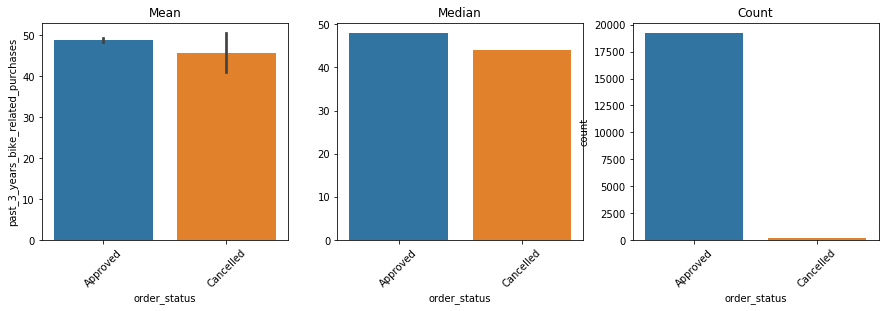

past_3_years_bike_related_purchases vs brand


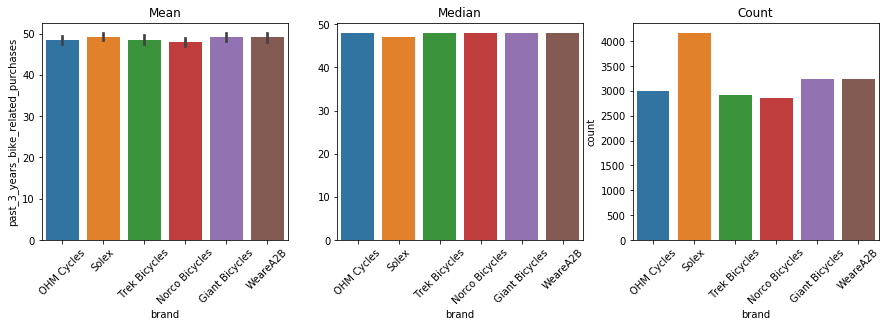

past_3_years_bike_related_purchases vs product_line


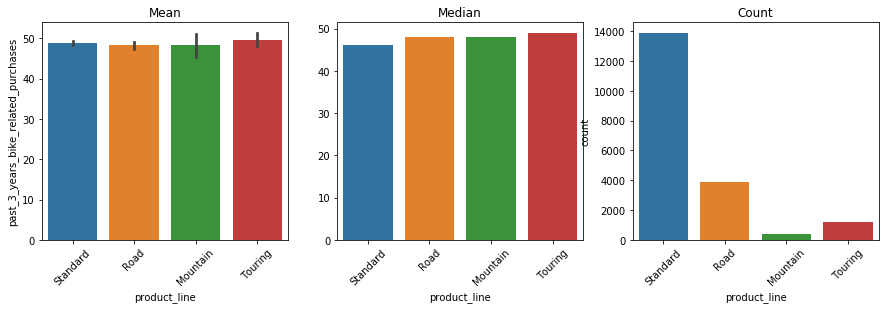

past_3_years_bike_related_purchases vs product_class


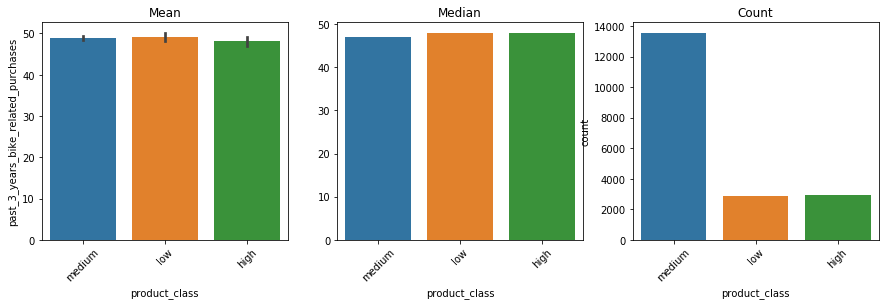

past_3_years_bike_related_purchases vs product_size


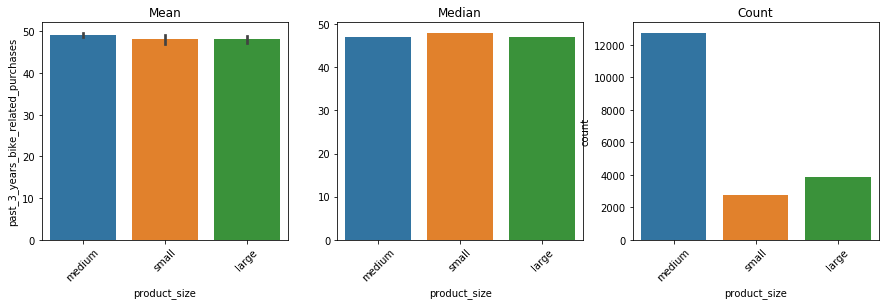

tenure vs order_status


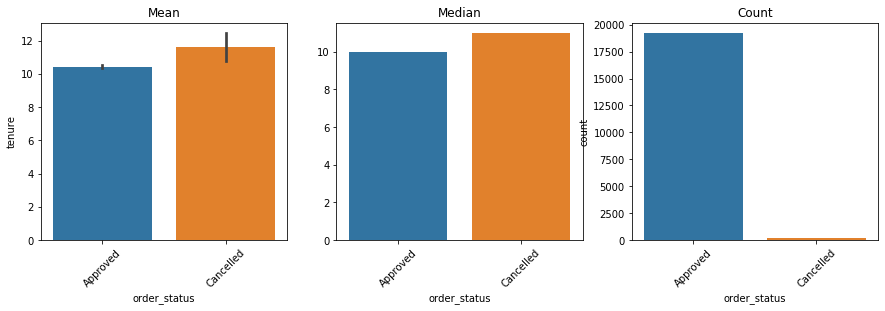

tenure vs brand


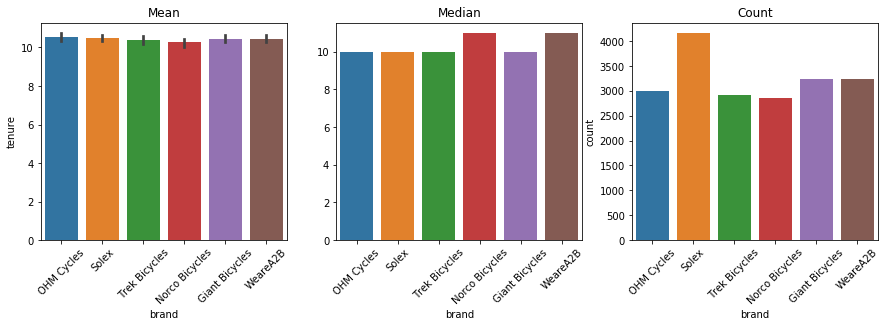

tenure vs product_line


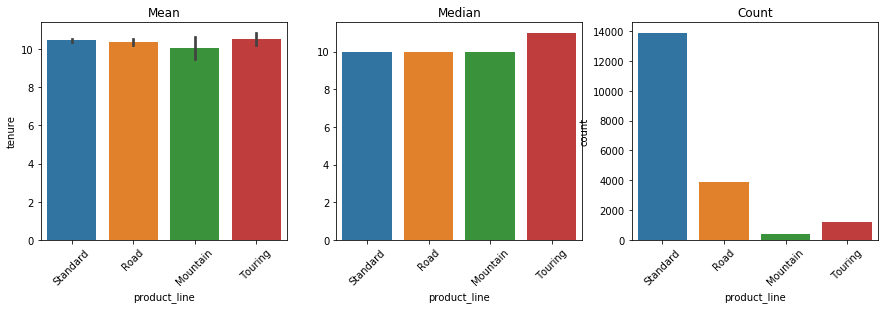

tenure vs product_class


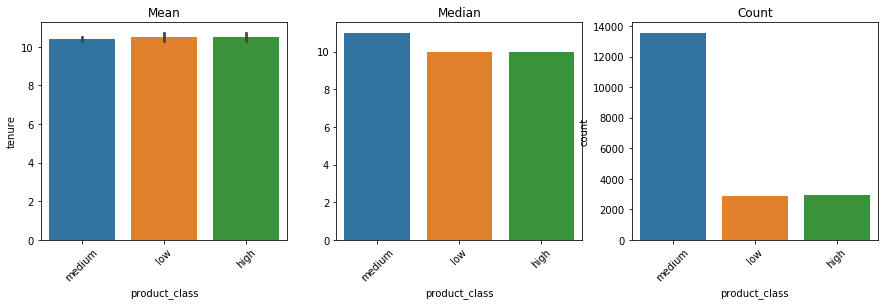

tenure vs product_size


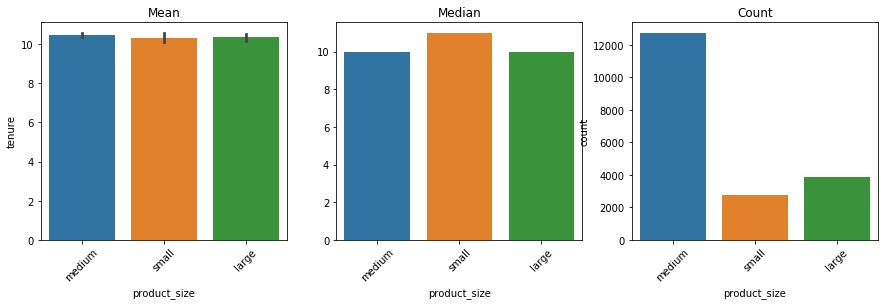

postcode vs order_status


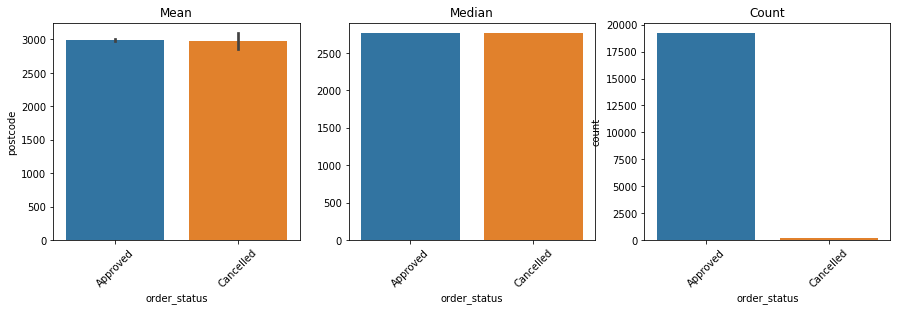

postcode vs brand


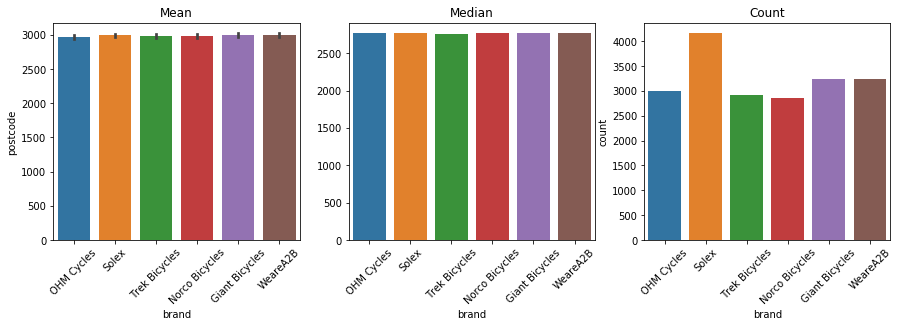

postcode vs product_line


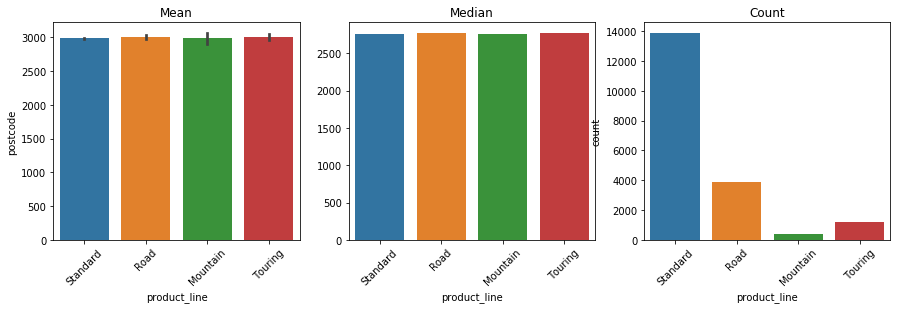

postcode vs product_class


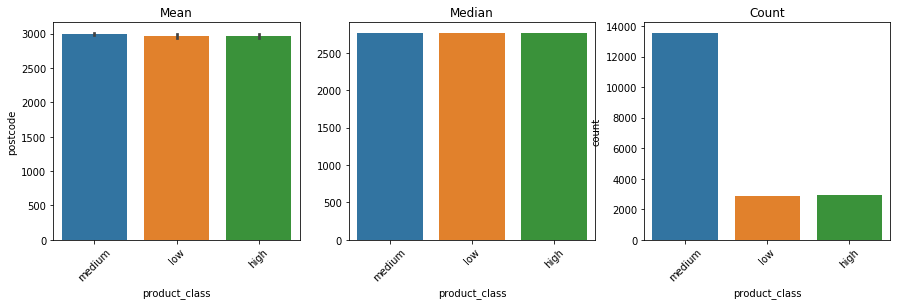

postcode vs product_size


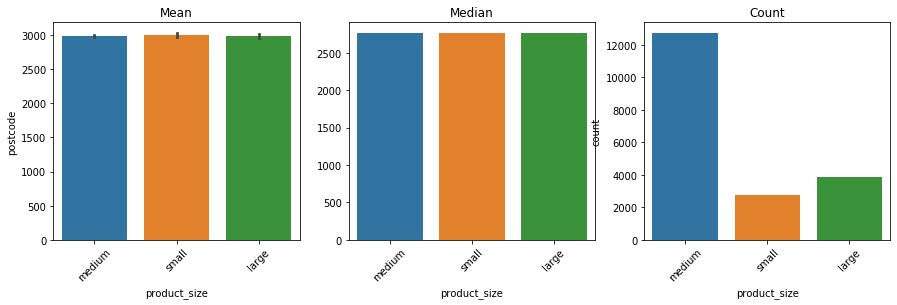

property_valuation vs order_status


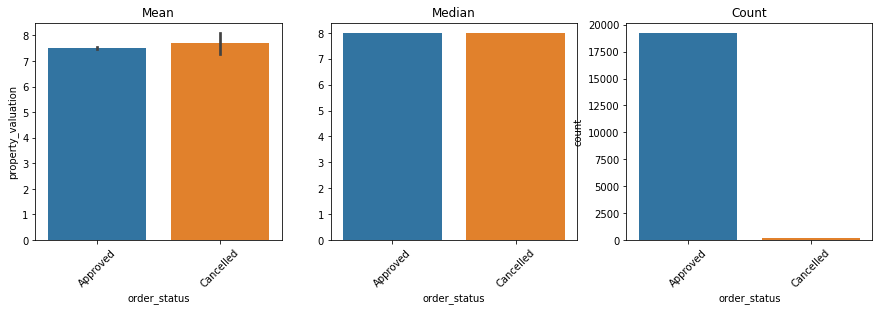

property_valuation vs brand


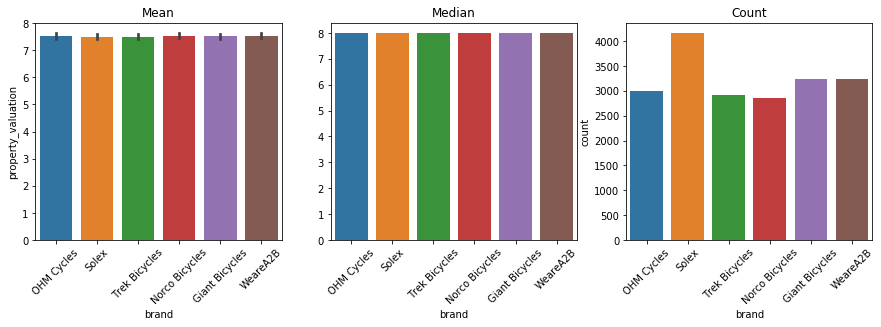

property_valuation vs product_line


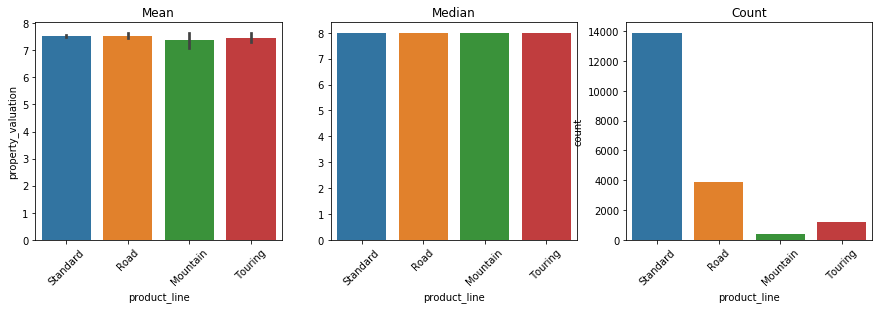

property_valuation vs product_class


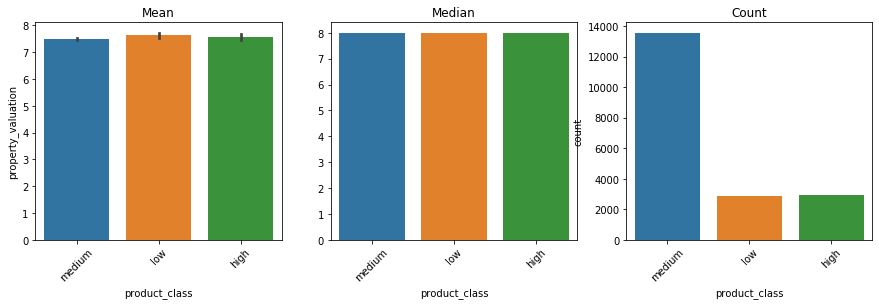

property_valuation vs product_size


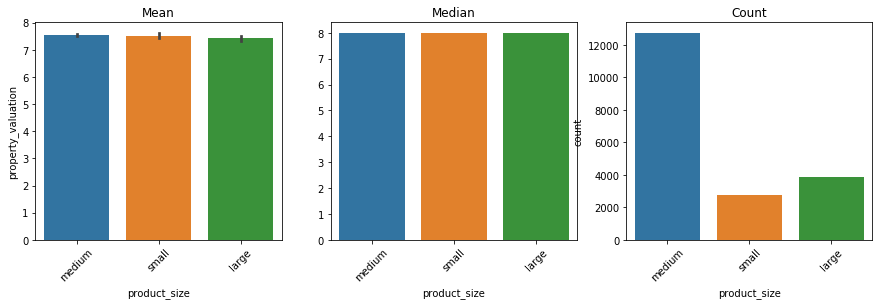

age vs order_status


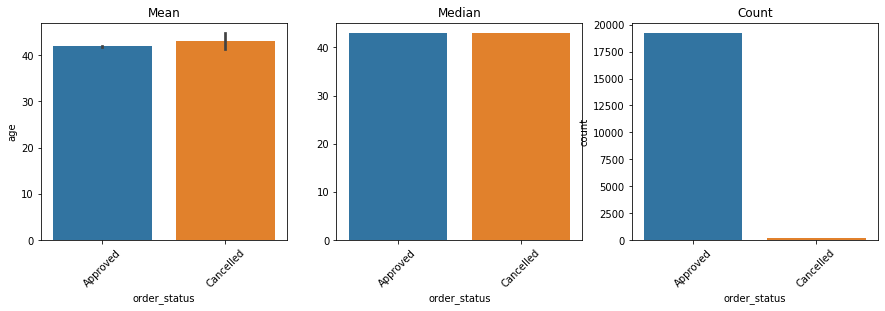

age vs brand


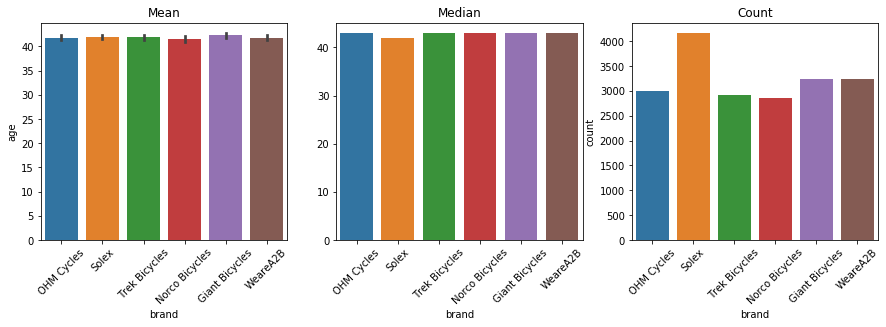

age vs product_line


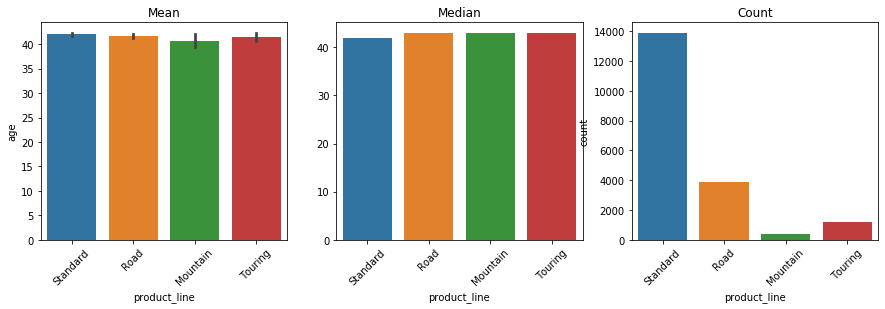

age vs product_class


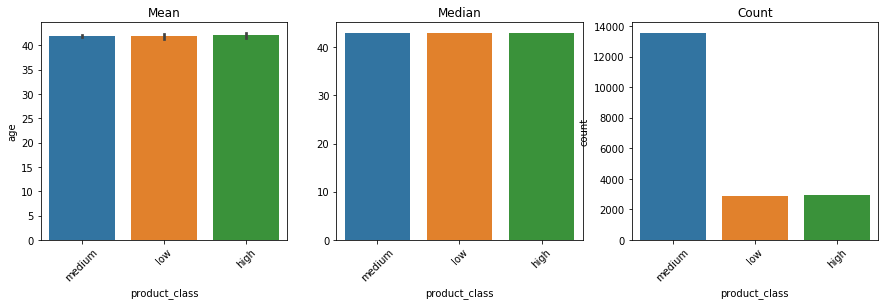

age vs product_size


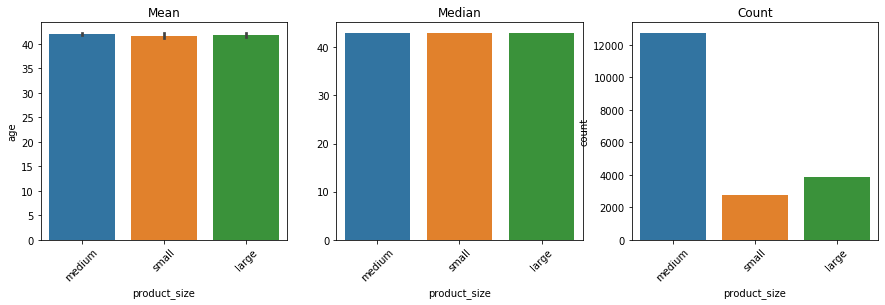

In [38]:
for num in num_indp_var:
    for cat in target_cat:
        indepNum_targetCat_compare(num, cat, df)

### Let's divide age, tenure and property_valuation into buckets

In [39]:
age_buckets = [0,18,25,35,45,55,65,1000]
age_labels = ['0-18','18-25','25-35','35-45','45-55','55-65','>65']

tenure_buckets = [0,5,10,15,20,1000]
tenure_labels = ['0-5','5-10','10-15','15-20','>20']

property_valuation_buckets = [0,4,6,8,10,1000]
property_valuation_labels = ['0-4','4-6','6-8','8-10','>10']

df['age_buckets_labels'] = pd.cut(df['age'], bins=age_buckets, labels=age_labels, include_lowest=True)
df['age_buckets'] = pd.cut(df['age'], bins=age_buckets, include_lowest=True)

df['tenure_buckets_labels'] = pd.cut(df['tenure'], bins=tenure_buckets, labels=tenure_labels, include_lowest=True)
df['tenure_buckets'] = pd.cut(df['tenure'], bins=tenure_buckets, include_lowest=True)

df['property_valuation_buckets_labels'] = pd.cut(df['property_valuation'], bins=property_valuation_buckets,
                                                 labels=property_valuation_labels, include_lowest=True)
df['property_valuation_buckets'] = pd.cut(df['property_valuation'], bins=property_valuation_buckets, include_lowest=True)

df.head(5)

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,transaction_id,product_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,address,postcode,state,country,property_valuation,birth_year,age,year,month,weekday,age_buckets_labels,age_buckets,tenure_buckets_labels,tenure_buckets,property_valuation_buckets_labels,property_valuation_buckets
0,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,94,86,2017-12-23,0.0,Approved,OHM Cycles,Standard,medium,medium,235.63,125.07,38482.0,060 Morning Avenue,2016,New South Wales,Australia,10,1953.0,67.0,2017,12,5,>65,"(65.0, 1000.0]",10-15,"(10.0, 15.0]",8-10,"(8.0, 10.0]"
1,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,3765,38,2017-04-06,1.0,Approved,Solex,Standard,medium,medium,1577.53,826.51,39526.0,060 Morning Avenue,2016,New South Wales,Australia,10,1953.0,67.0,2017,4,3,>65,"(65.0, 1000.0]",10-15,"(10.0, 15.0]",8-10,"(8.0, 10.0]"
2,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,5157,47,2017-05-11,1.0,Approved,Trek Bicycles,Road,low,small,1720.70,1531.42,37823.0,060 Morning Avenue,2016,New South Wales,Australia,10,1953.0,67.0,2017,5,3,>65,"(65.0, 1000.0]",10-15,"(10.0, 15.0]",8-10,"(8.0, 10.0]"
3,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,9785,72,2017-01-05,0.0,Approved,Norco Bicycles,Standard,medium,medium,360.40,270.30,37873.0,060 Morning Avenue,2016,New South Wales,Australia,10,1953.0,67.0,2017,1,3,>65,"(65.0, 1000.0]",10-15,"(10.0, 15.0]",8-10,"(8.0, 10.0]"
4,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,13424,2,2017-02-21,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,38573.0,060 Morning Avenue,2016,New South Wales,Australia,10,1953.0,67.0,2017,2,1,>65,"(65.0, 1000.0]",10-15,"(10.0, 15.0]",8-10,"(8.0, 10.0]"


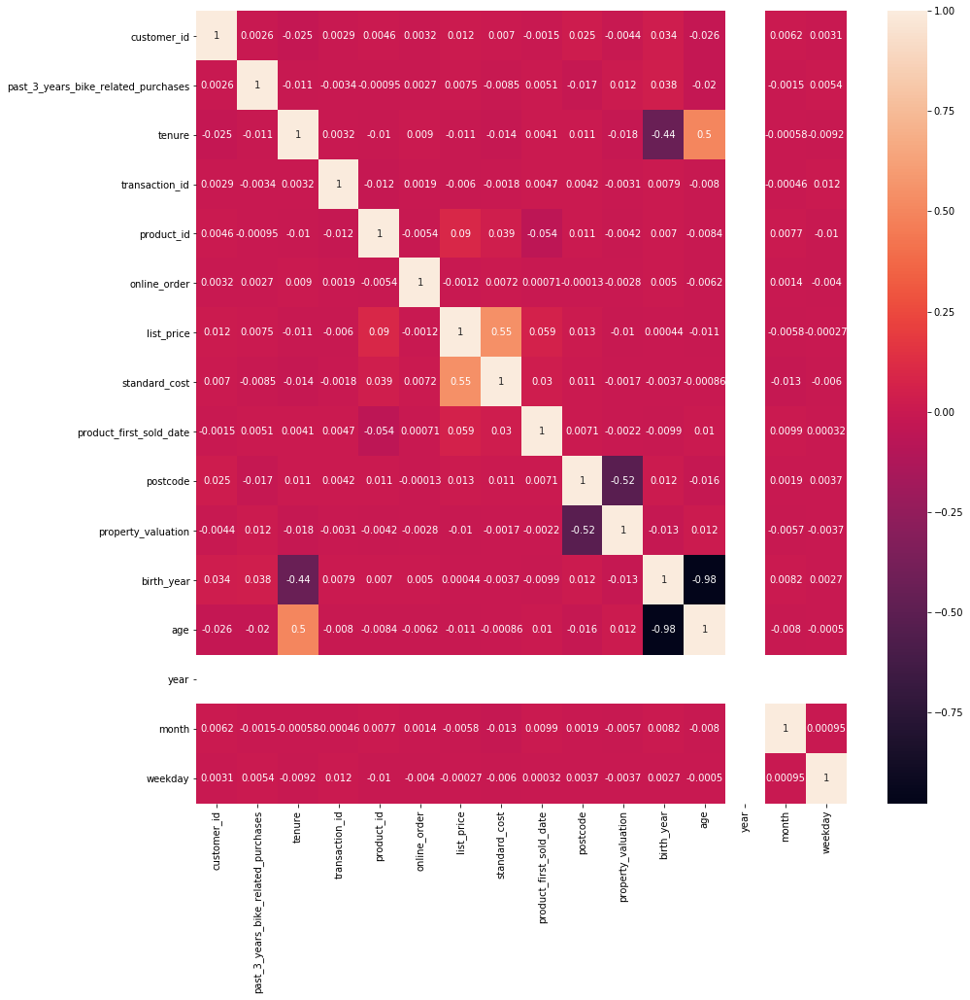

In [44]:
plt.figure(figsize = (15,15))
sns.heatmap(df.corr(), annot=True)
plt.show()

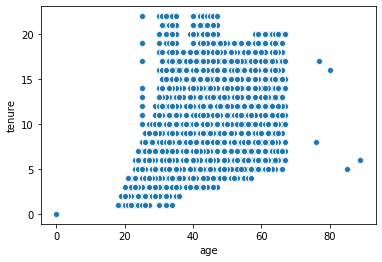

In [45]:
sns.scatterplot(df.age, df.tenure)

In [46]:
target_cat

['order_status', 'brand', 'product_line', 'product_class', 'product_size']

In [47]:
def table_analys(df, new_var, target_cat):
    for var in target_cat:
        plt.figure(figsize = (12,6))
        sns.heatmap(pd.pivot_table(df, index=new_var, columns=var, aggfunc='count', values='customer_id'),
                    annot=True, fmt='.5g')
        plt.yticks(rotation = 0)
        plt.show()

#### Age Buckets

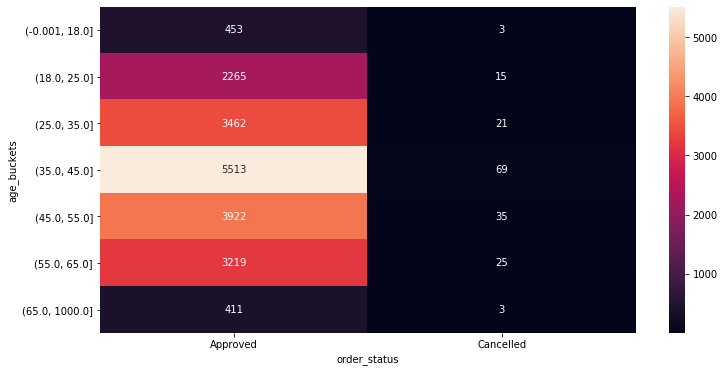

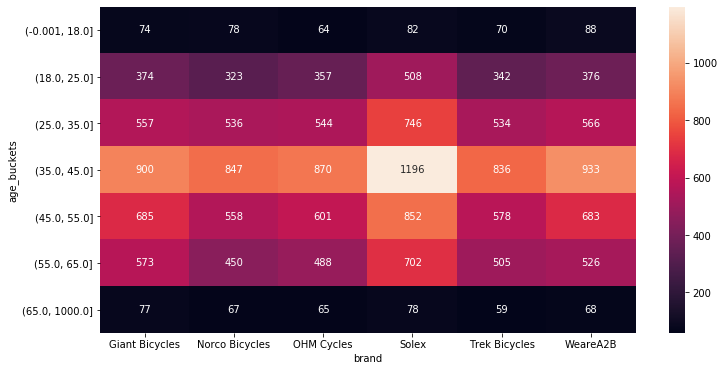

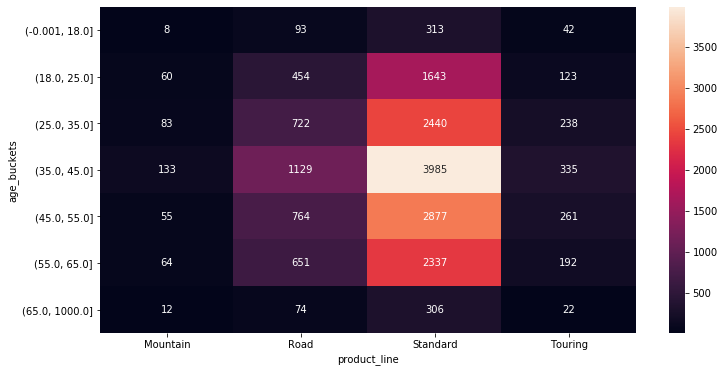

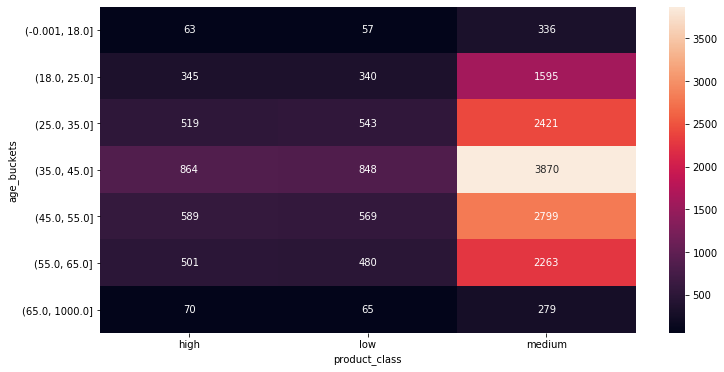

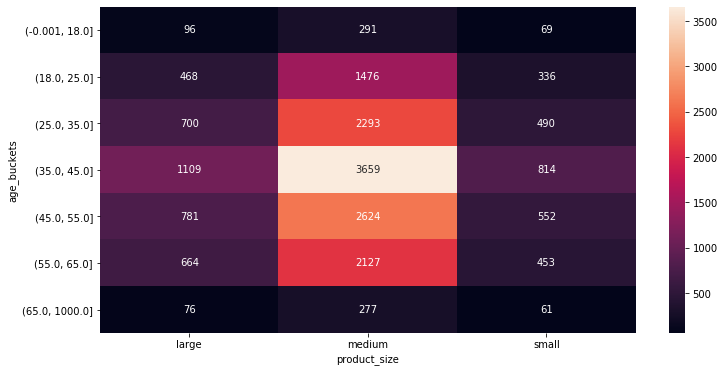

In [48]:
table_analys(df, 'age_buckets', target_cat)

#### Tenure Buckets

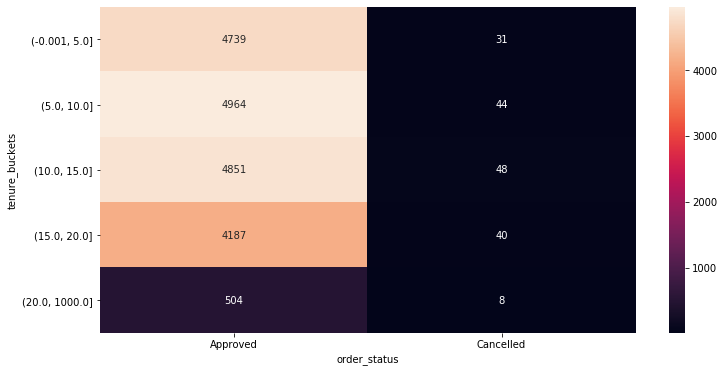

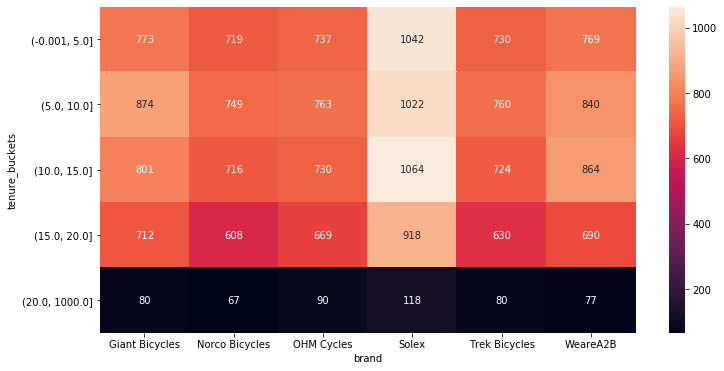

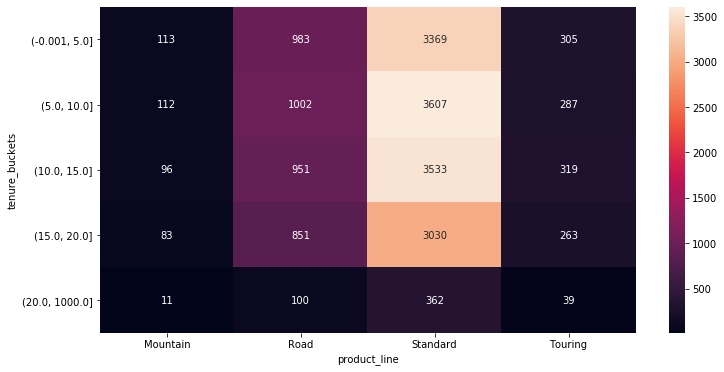

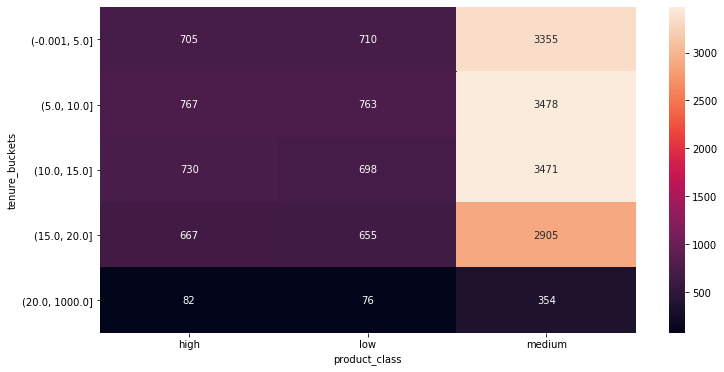

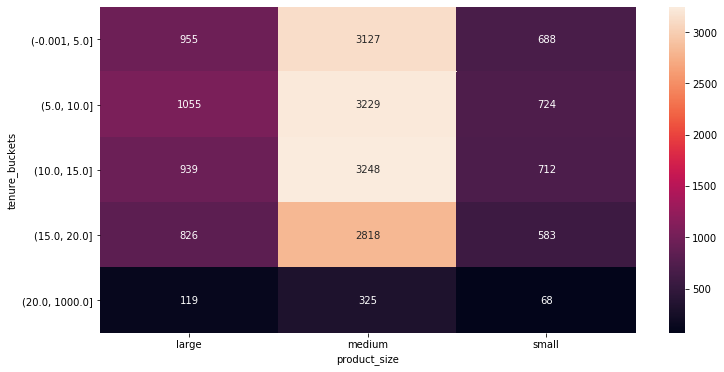

In [49]:
table_analys(df, 'tenure_buckets', target_cat)

#### Property valuation buckets

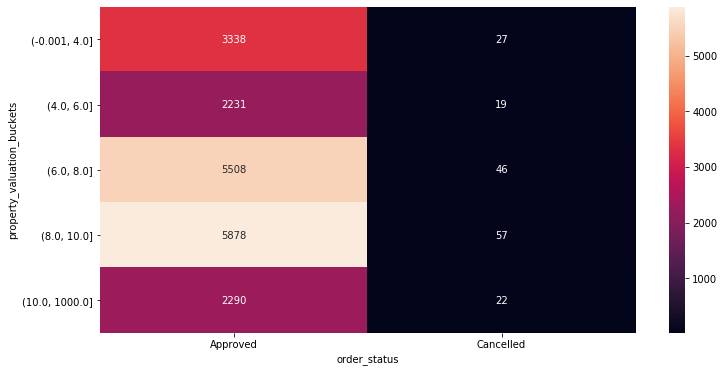

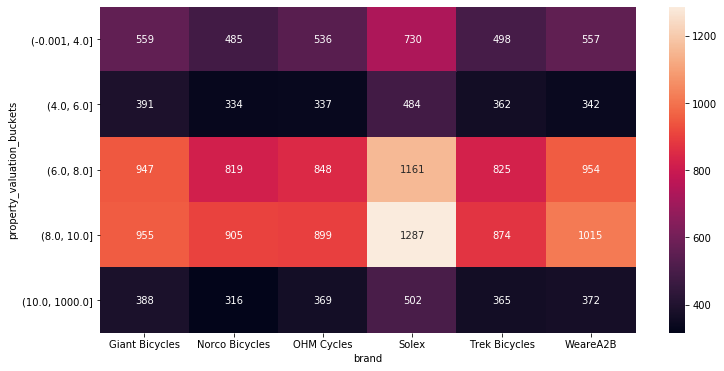

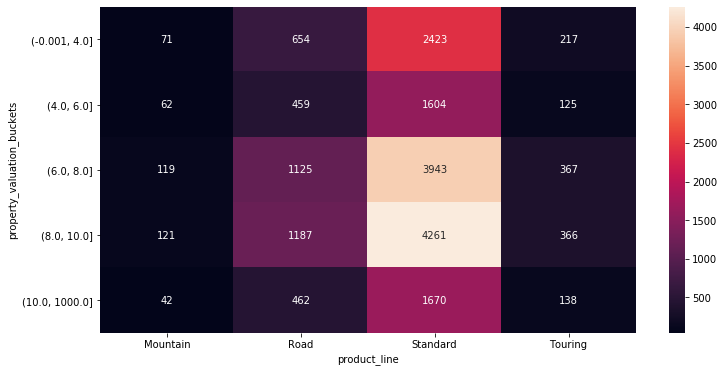

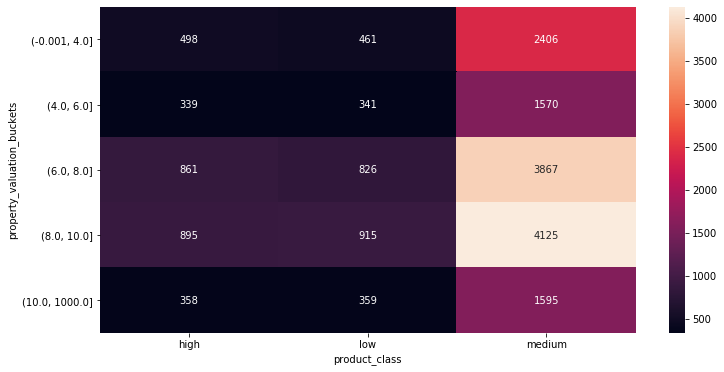

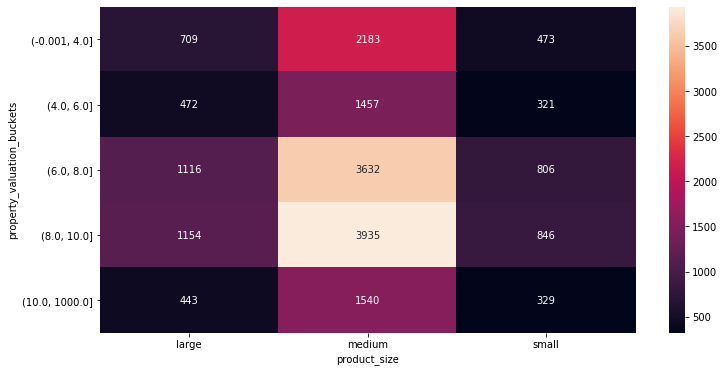

In [50]:
table_analys(df, 'property_valuation_buckets', target_cat)

In [51]:
def buckets_vs_buckets(b1, b2):
    plt.figure(figsize = (12,6))
    sns.heatmap(pd.pivot_table(df, index=b1, columns=b2, aggfunc='count', values='customer_id'),
                               annot=True, fmt='.5g')
    plt.yticks(rotation = 0)
    plt.show()

#### Age buckets vs Tenure buckets

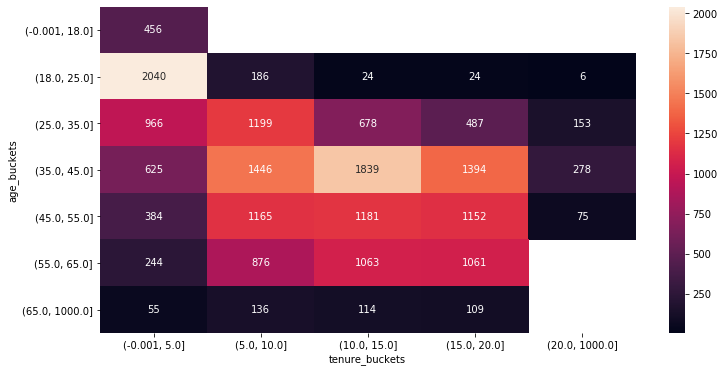

In [52]:
buckets_vs_buckets('age_buckets', 'tenure_buckets')

#### Age buckets vs Property Valuation buckets

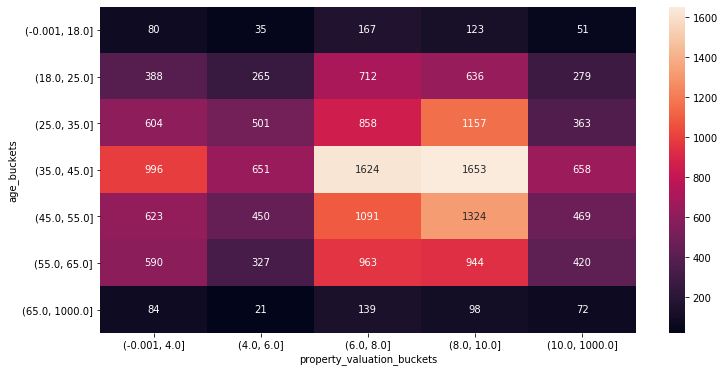

In [53]:
buckets_vs_buckets('age_buckets', 'property_valuation_buckets')

#### Property Valuation buckets vs Tenure buckets

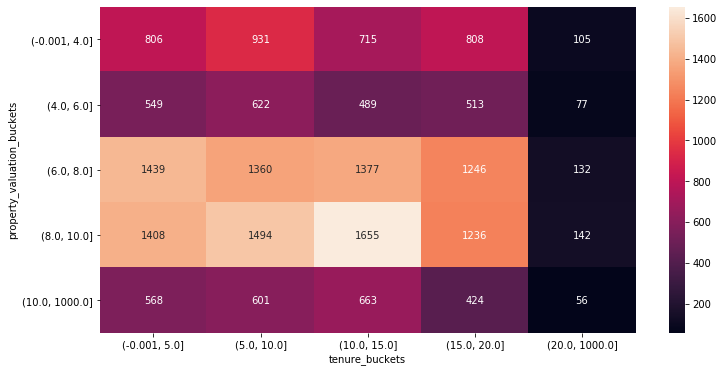

In [54]:
buckets_vs_buckets('property_valuation_buckets', 'tenure_buckets')

#### Independent numeric variables vs targe numeric variables

past_3_years_bike_related_purchases vs online_order


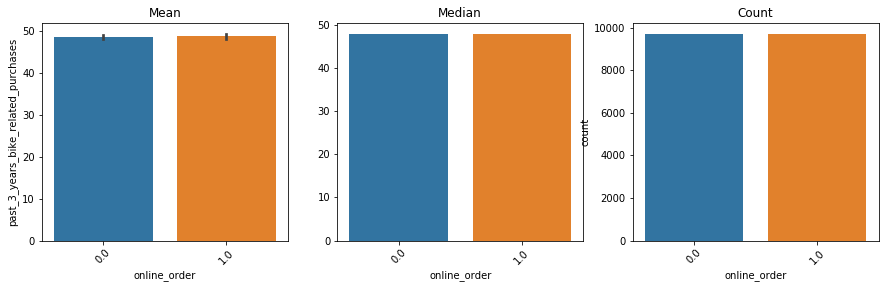

past_3_years_bike_related_purchases vs month


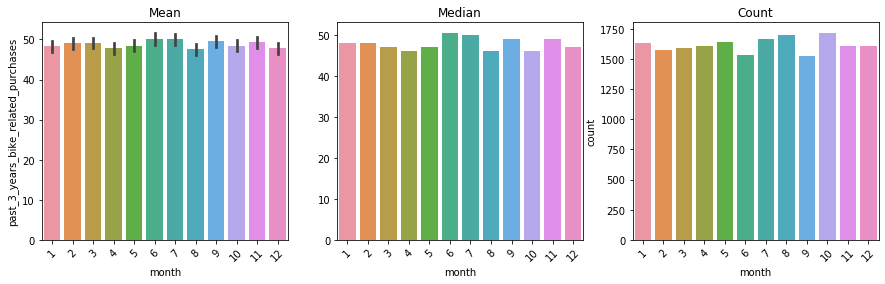

past_3_years_bike_related_purchases vs weekday


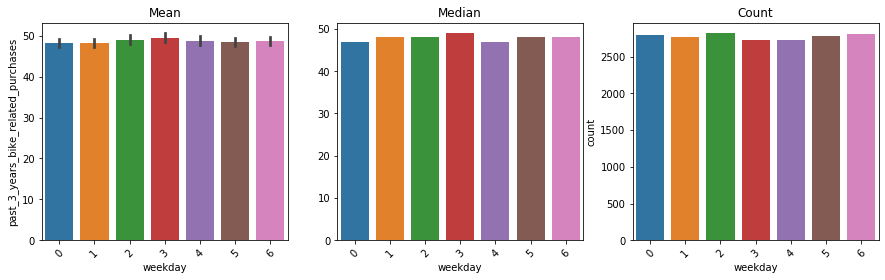

tenure vs online_order


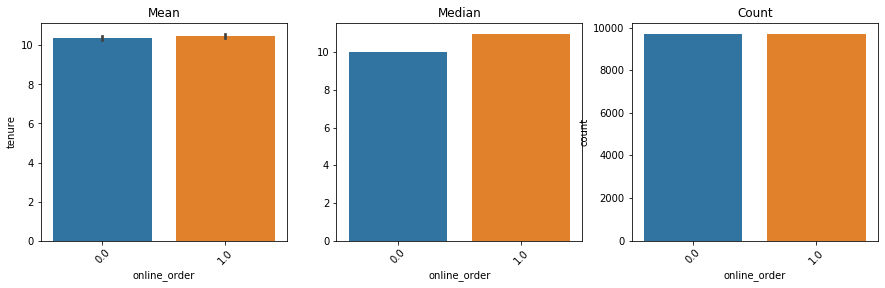

tenure vs month


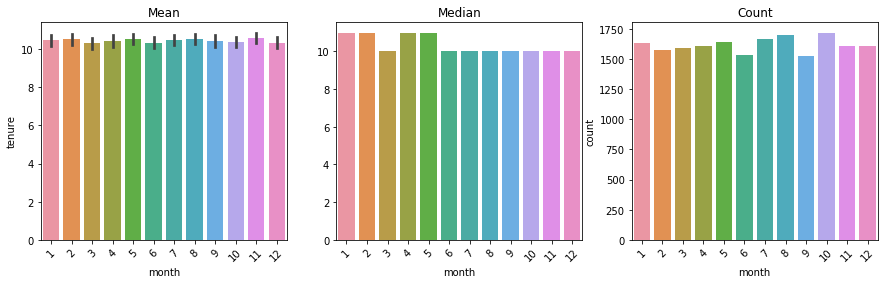

tenure vs weekday


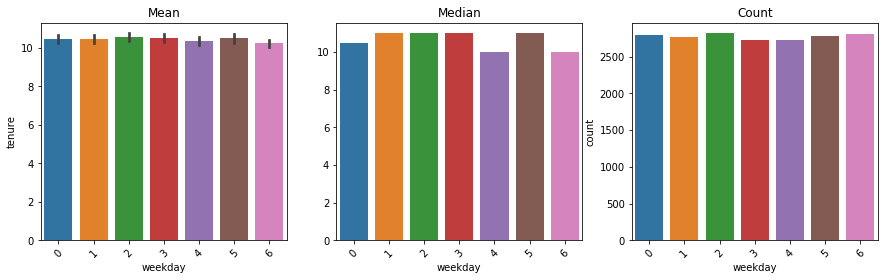

postcode vs online_order


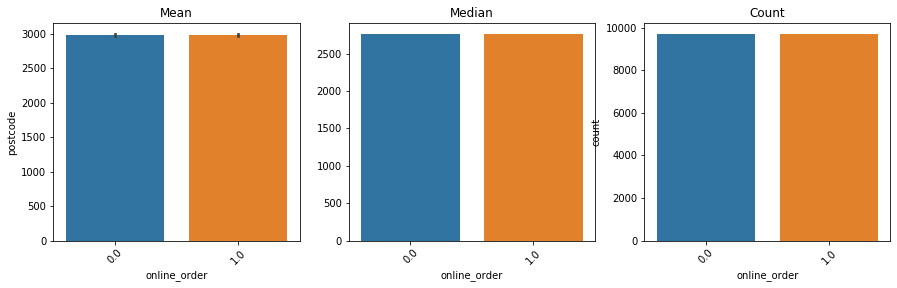

postcode vs month


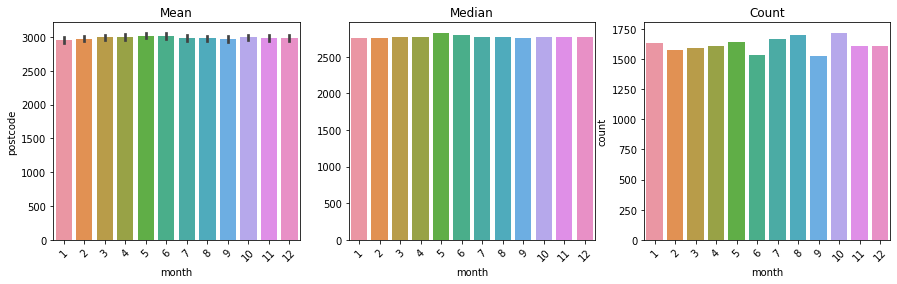

postcode vs weekday


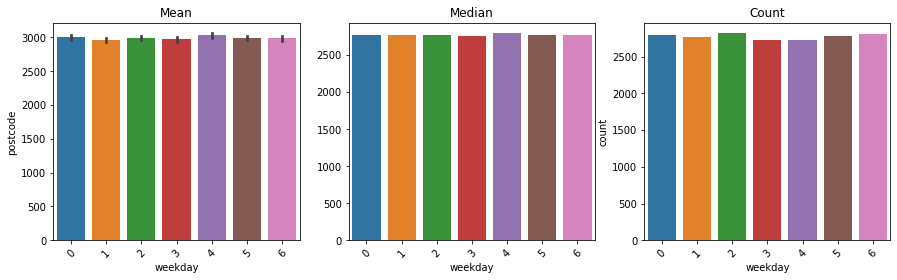

property_valuation vs online_order


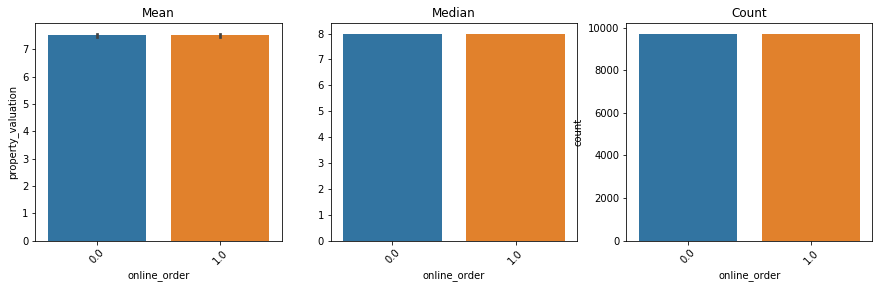

property_valuation vs month


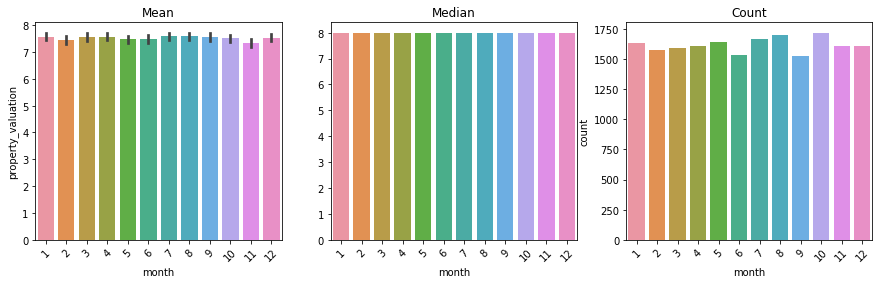

property_valuation vs weekday


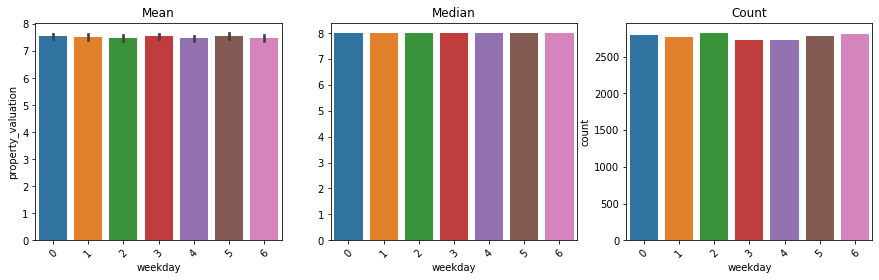

age vs online_order


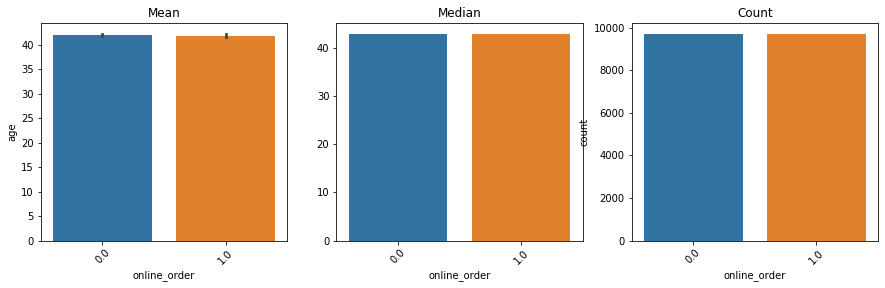

age vs month


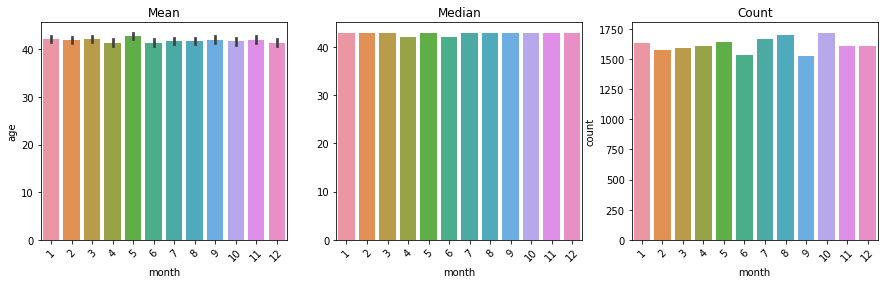

age vs weekday


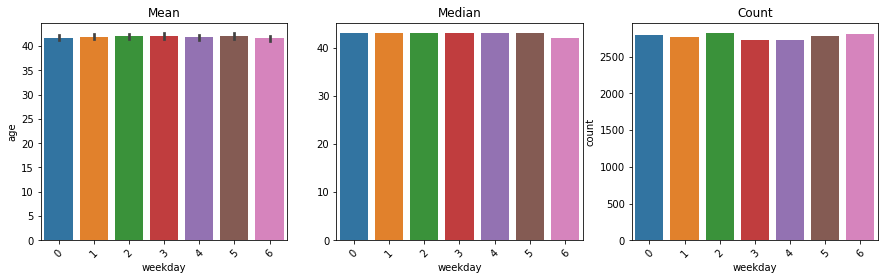

In [56]:
for num in num_indp_var:
    for t_num in ['online_order', 'month', 'weekday']:
        indepNum_targetCat_compare(num, t_num, df)

#### Age buckets vs target_num

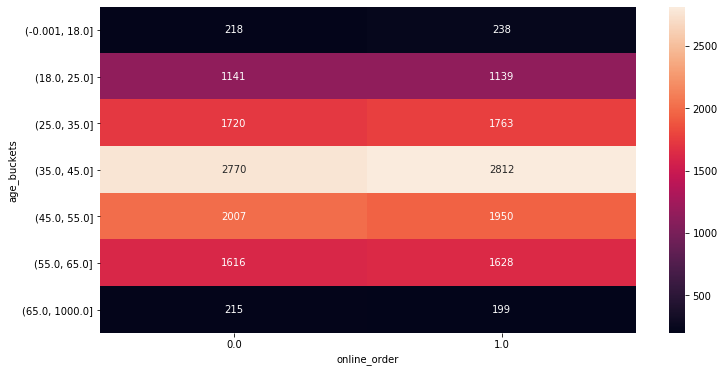

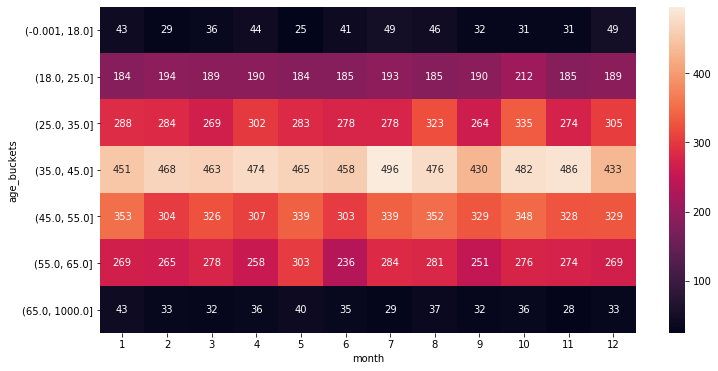

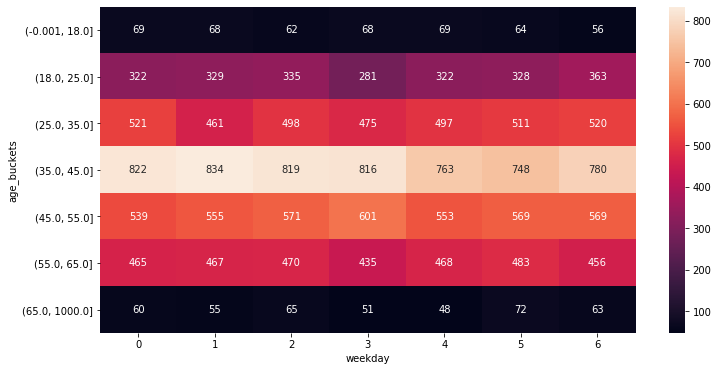

In [57]:
table_analys(df, 'age_buckets', ['online_order', 'month', 'weekday'])

#### Tenure buckets vs target_num

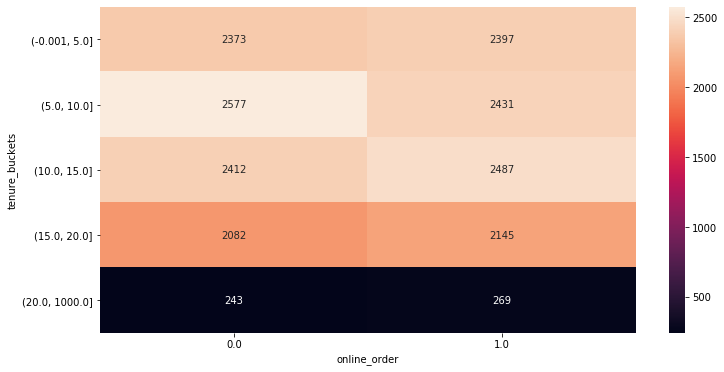

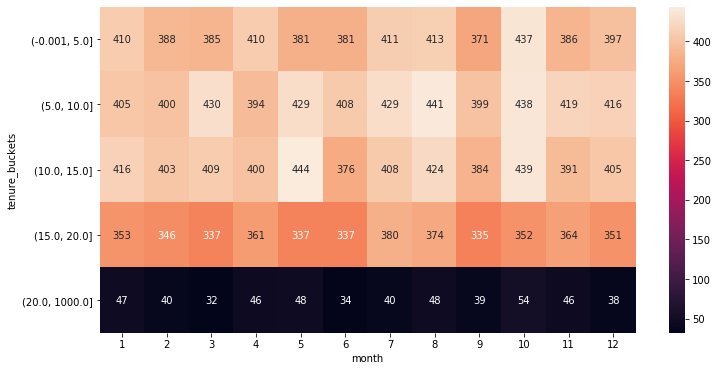

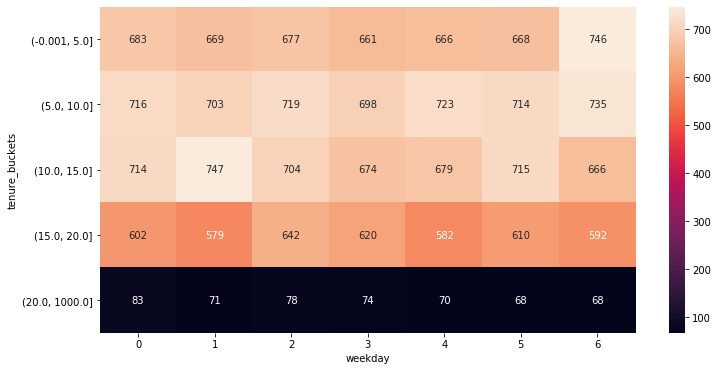

In [58]:
table_analys(df, 'tenure_buckets', ['online_order', 'month', 'weekday'])

#### Property Valuation buckets vs target_num

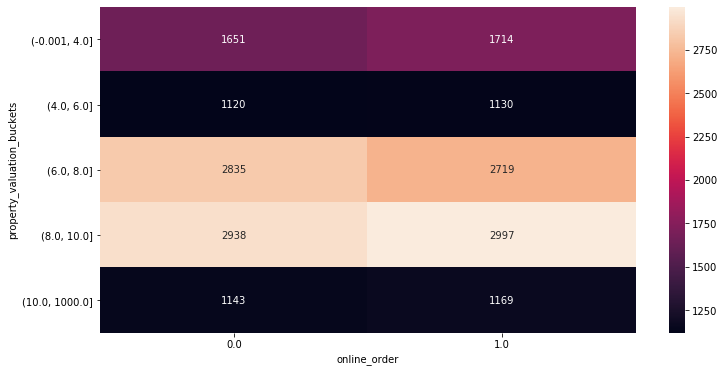

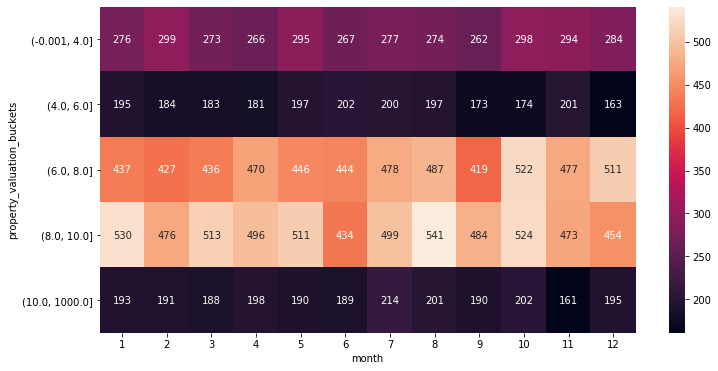

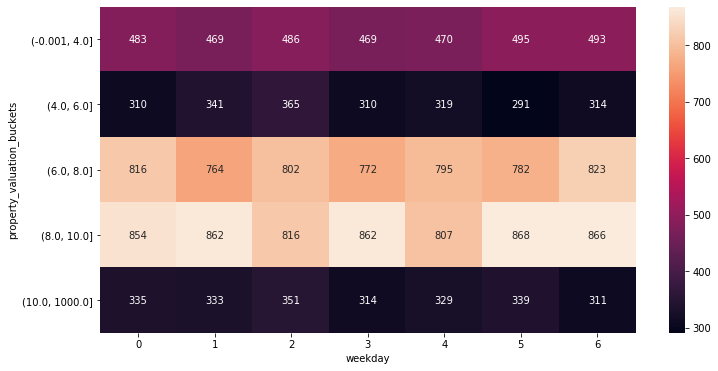

In [59]:
table_analys(df, 'property_valuation_buckets', ['online_order', 'month', 'weekday'])

#### Independent numeric variables vs left target numeric variables

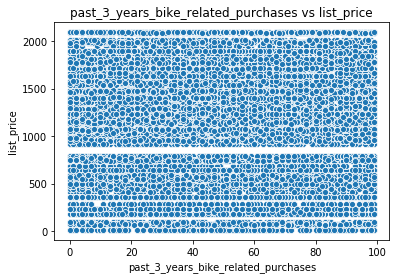

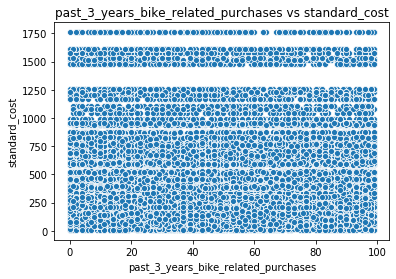

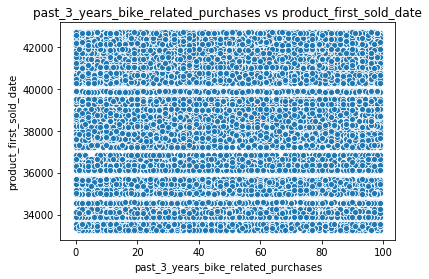

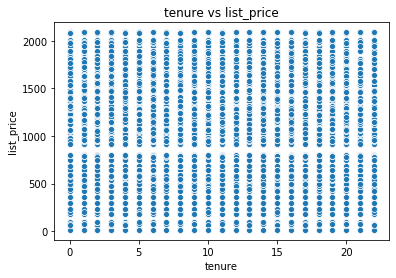

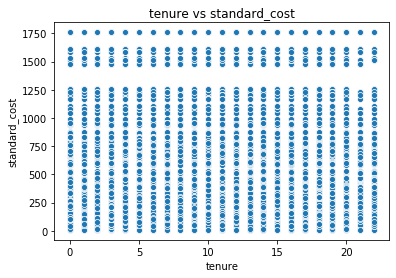

...

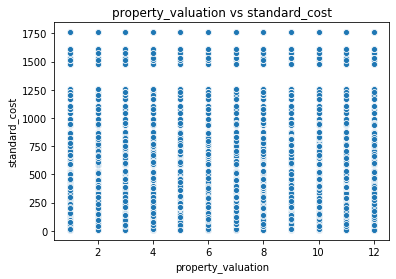

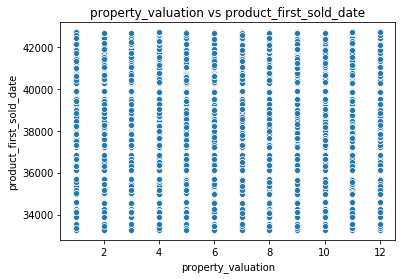

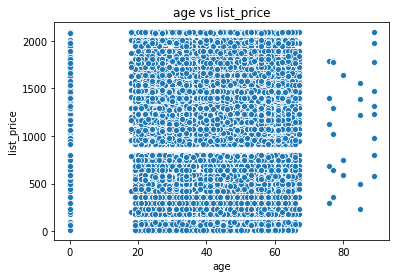

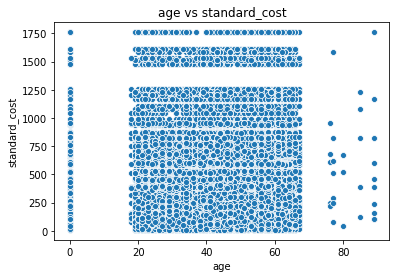

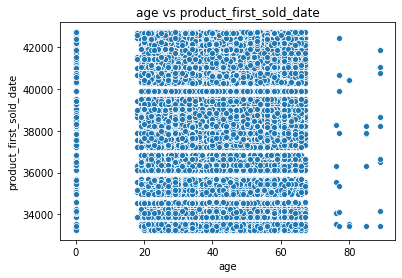

In [60]:
for num in num_indp_var:
    for t_num in ['list_price', 'standard_cost', 'product_first_sold_date']:
        sns.scatterplot(df[num], df[t_num])
        plt.title(num+' vs '+t_num)
        plt.show()

## Independent categorical  variables

In [62]:
cat_indp_var = [var for var in independent_attribute if df[var].dtypes == 'object']
cat_indp_var

['first_name',
 'last_name',
 'gender',
 'job_title',
 'job_industry_category',
 'wealth_segment',
 'deceased_indicator',
 'owns_car',
 'address',
 'state',
 'country']

In [63]:
for var in cat_indp_var:
    print(var,'->',df[var].nunique(),'\n')

first_name -> 2834 

last_name -> 3261 

gender -> 6 

job_title -> 196 

job_industry_category -> 10 

wealth_segment -> 3 

deceased_indicator -> 2 

owns_car -> 2 

address -> 3485 

state -> 5 

country -> 1 



* first name and last name does not have any predictive powers, therefore will not be used 
* country has only one label, all the customers belongs to same country
* gender has 6 labels, need to fix it 

In [64]:
cat_indp_var = cat_indp_var[2:-1]
cat_indp_var

['gender',
 'job_title',
 'job_industry_category',
 'wealth_segment',
 'deceased_indicator',
 'owns_car',
 'address',
 'state']

In [65]:
# unique labels of gender columns 
df.gender.unique()

array(['F', 'Male', 'Female', 'U', 'Femal', 'M'], dtype=object)

#### Fixing gender labels

In [66]:
def gender_labels(label):
    if label == 'Male':
        return 'M'
    elif label == 'Female' or label == 'Femal':
        return 'F'
    else:
        return label
    
df['gender'] = df['gender'].apply(gender_labels)
df['gender'].unique()

array(['F', 'M', 'U'], dtype=object)

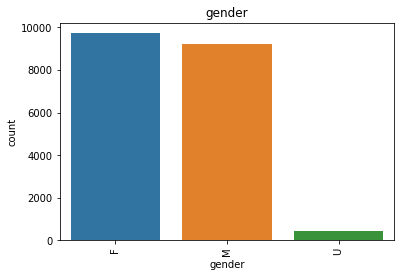

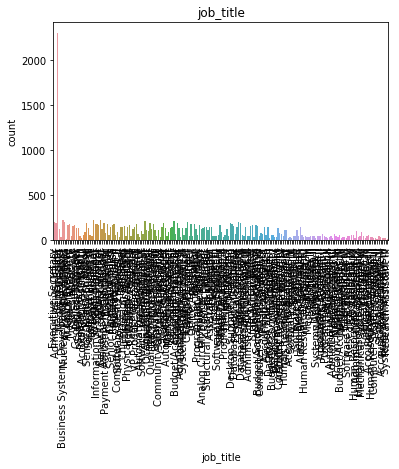

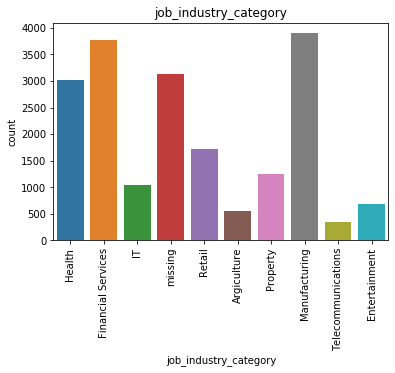

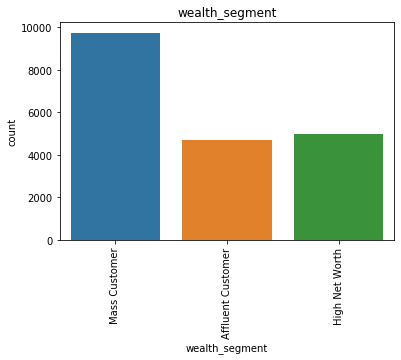

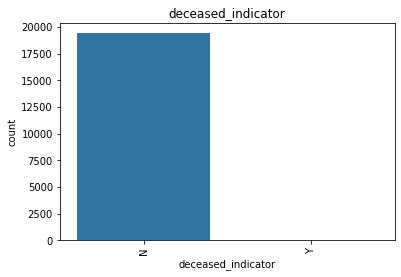

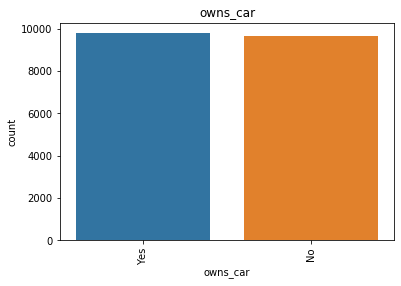

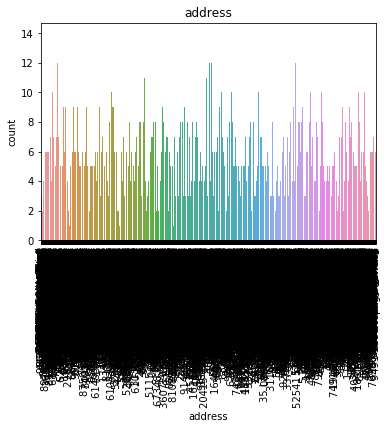

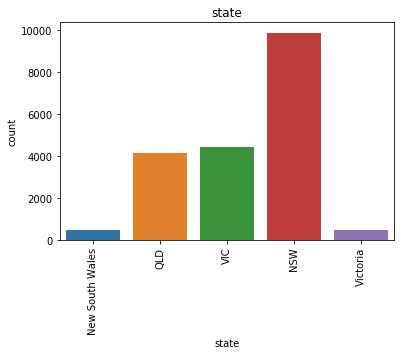

In [67]:
for var in cat_indp_var:
    sns.countplot(df[var])
    plt.title(var)
    plt.xticks(rotation=90)
    plt.show()

#### Fixing state labels

In [68]:
def state_labels(label):
    if label == 'New South Wales':
        return 'NSW'
    elif label == 'Victoria':
        return 'VIC'
    else:
        return label
    
df['state'] = df['state'].apply(state_labels)
df['state'].unique()

array(['NSW', 'QLD', 'VIC'], dtype=object)

In [69]:
# Percentage of each labels of categorical variables in dataset
for var in ['gender', 'job_industry_category', 'wealth_segment', 'deceased_indicator', 'owns_car', 'state']:
    print(var,'\n',df[var].value_counts()/df.shape[0]*100,'\n')

gender 
 F    50.144211
M    47.599918
U     2.255871
Name: gender, dtype: float64 

job_industry_category 
 Manufacturing         20.071075
Financial Services    19.406675
missing               16.115575
Health                15.533581
Retail                 8.848372
Property               6.443140
IT                     5.361557
Entertainment          3.533169
Argiculture            2.879069
Telecommunications     1.807787
Name: job_industry_category, dtype: float64 

wealth_segment 
 Mass Customer        50.190564
High Net Worth       25.520190
Affluent Customer    24.289246
Name: wealth_segment, dtype: float64 

deceased_indicator 
 N    99.958797
Y     0.041203
Name: deceased_indicator, dtype: float64 

owns_car 
 Yes    50.375979
No     49.624021
Name: owns_car, dtype: float64 

state 
 NSW    53.378657
VIC    25.278121
QLD    21.343222
Name: state, dtype: float64 



In [70]:
target_cat

['order_status', 'brand', 'product_line', 'product_class', 'product_size']

In [71]:
target_num

['online_order',
 'list_price',
 'standard_cost',
 'product_first_sold_date',
 'month',
 'weekday']

In [72]:
cat_indp_var

['gender',
 'job_title',
 'job_industry_category',
 'wealth_segment',
 'deceased_indicator',
 'owns_car',
 'address',
 'state']

In [73]:
variable = iter(cat_indp_var)

### Gender vs target categorical columns

In [74]:
next(variable)

'gender'

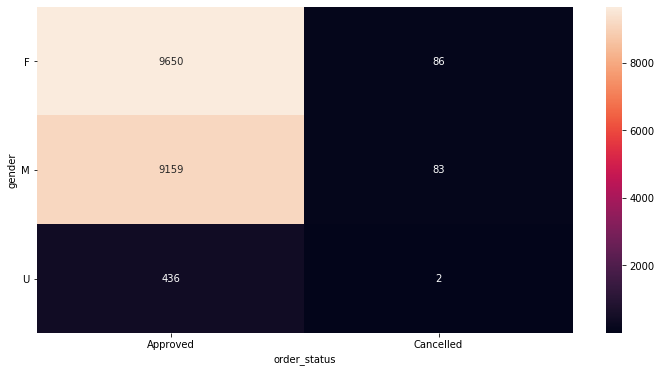

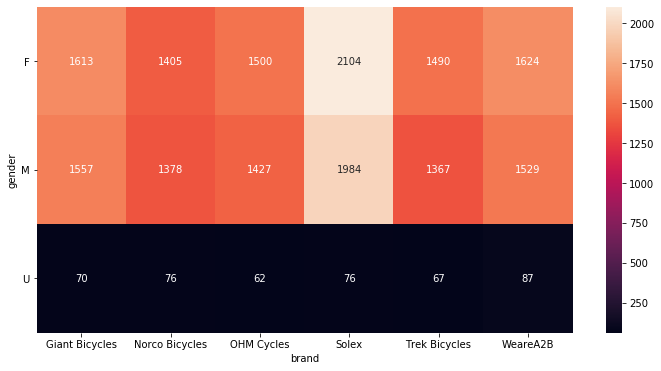

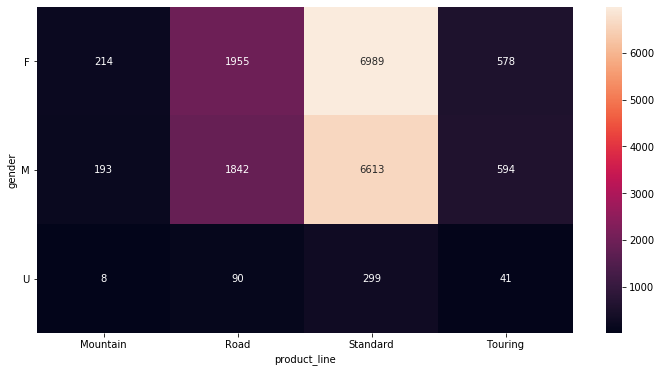

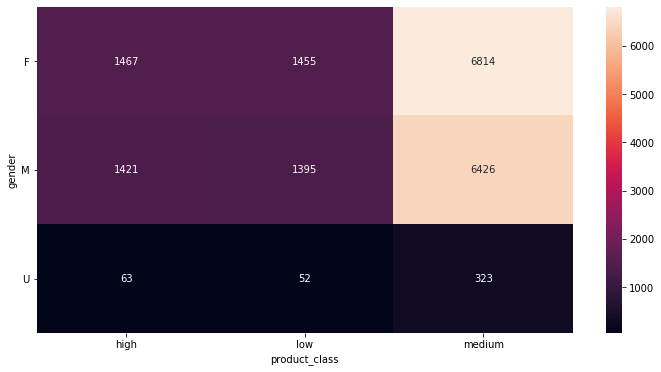

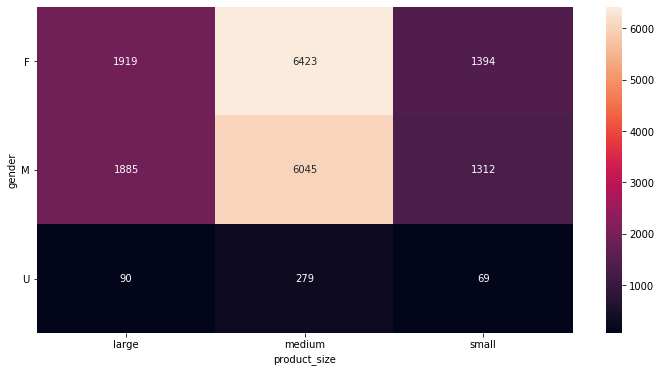

In [75]:
table_analys(df, 'gender', target_cat)

In [76]:
next(variable)

'job_title'

In [77]:
next(variable)

'job_industry_category'

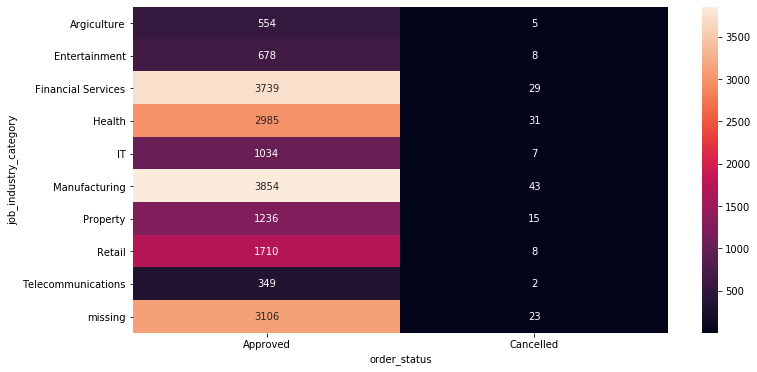

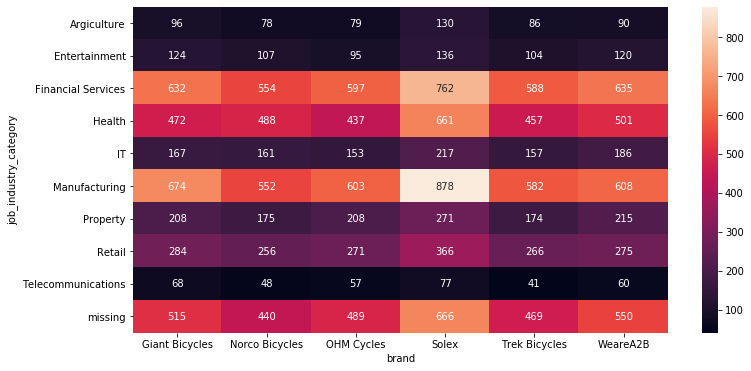

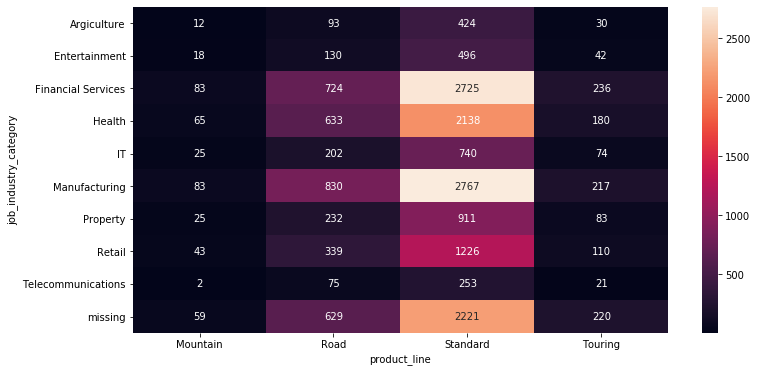

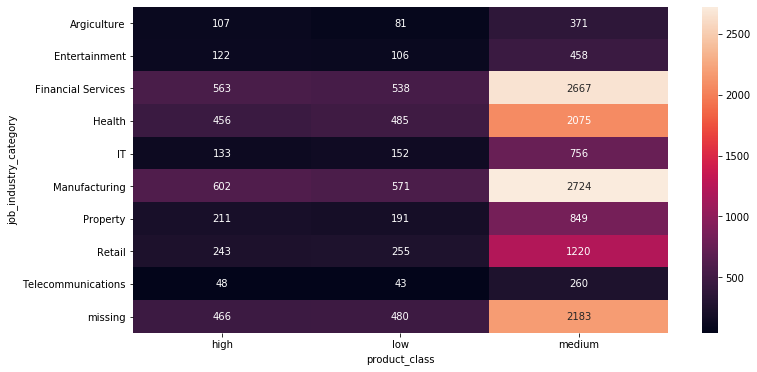

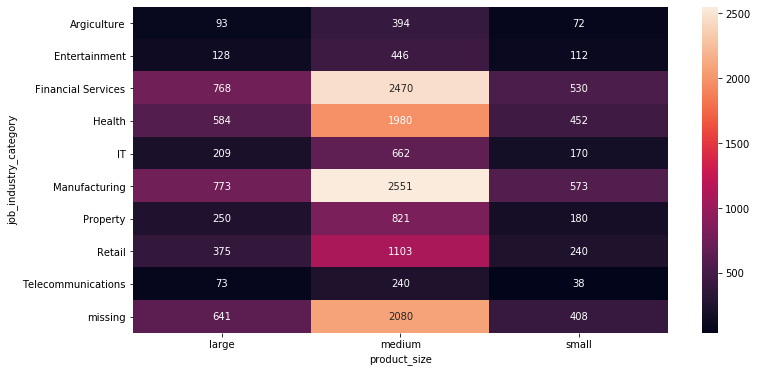

In [78]:
table_analys(df, 'job_industry_category', target_cat)

In [79]:
next(variable)

'wealth_segment'

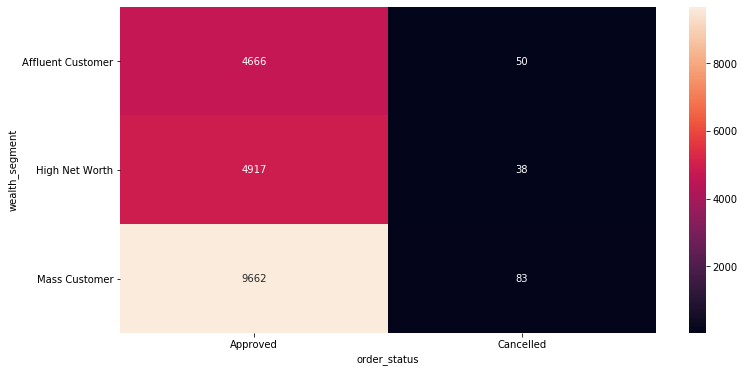

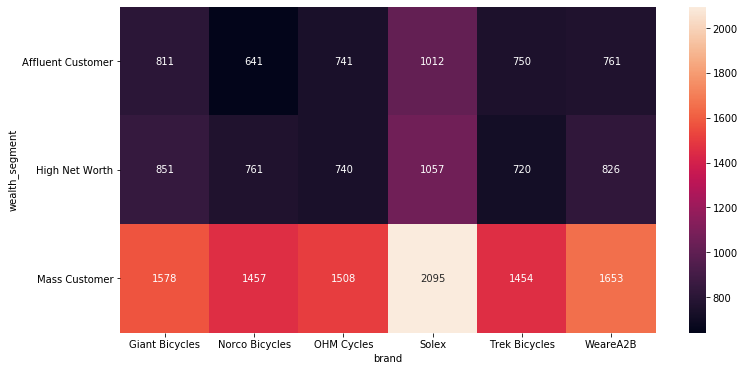

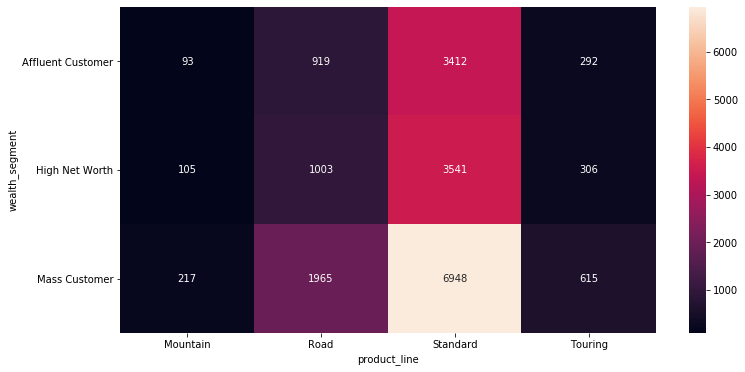

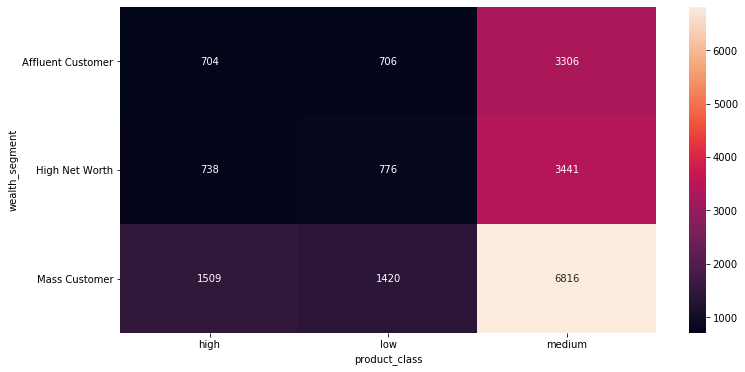

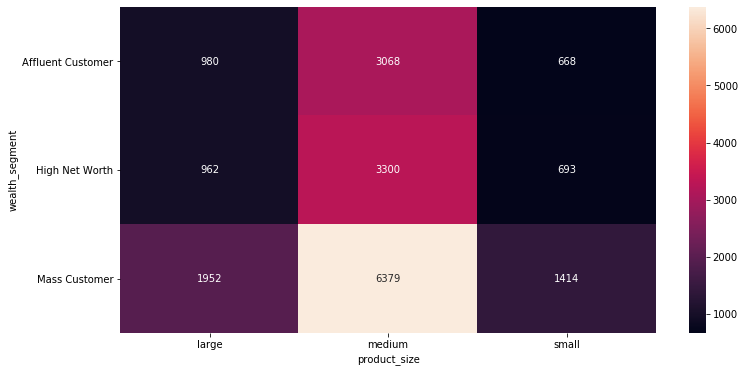

In [80]:
table_analys(df, 'wealth_segment', target_cat)

In [81]:
next(variable)

'deceased_indicator'

In [82]:
next(variable)

'owns_car'

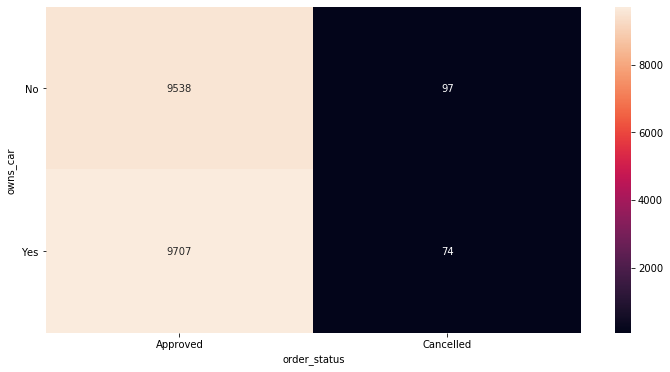

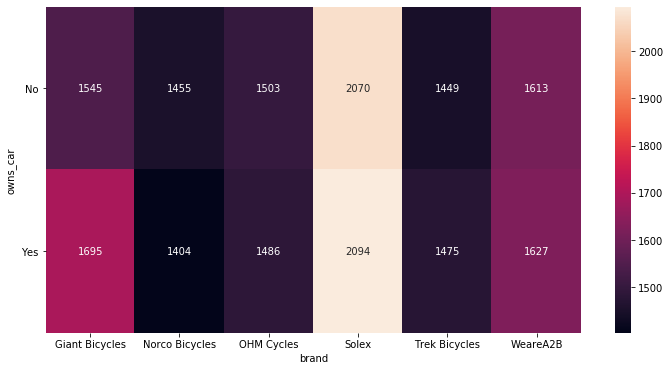

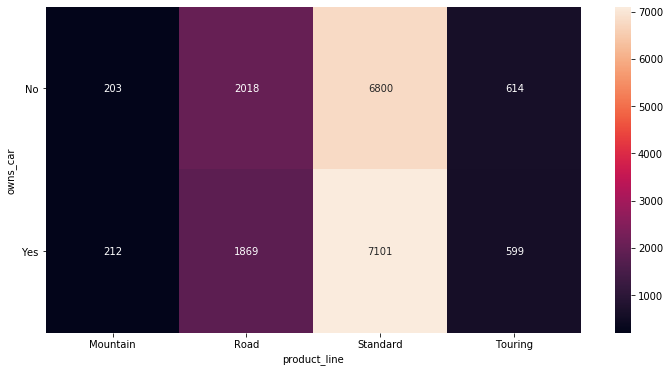

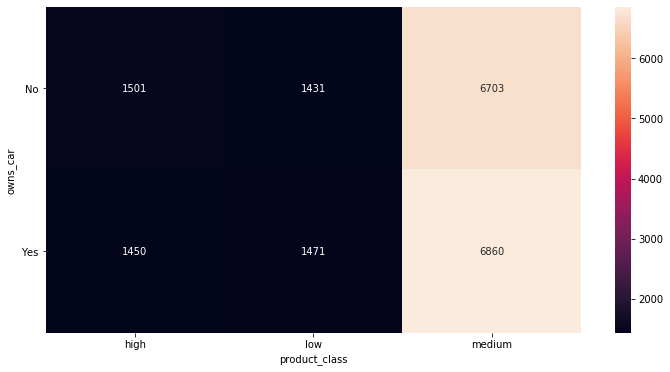

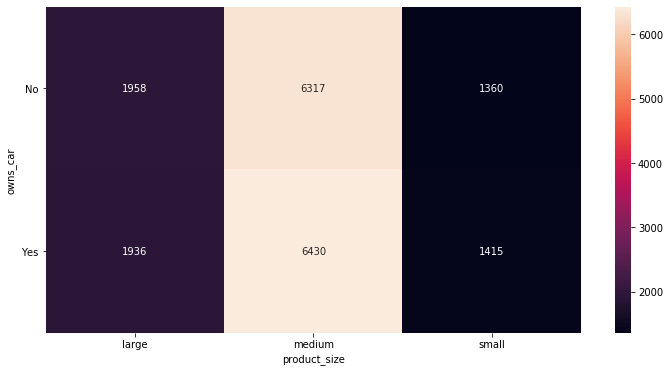

In [83]:
table_analys(df, 'owns_car', target_cat)

In [84]:
next(variable)

'address'

In [85]:
next(variable)

'state'

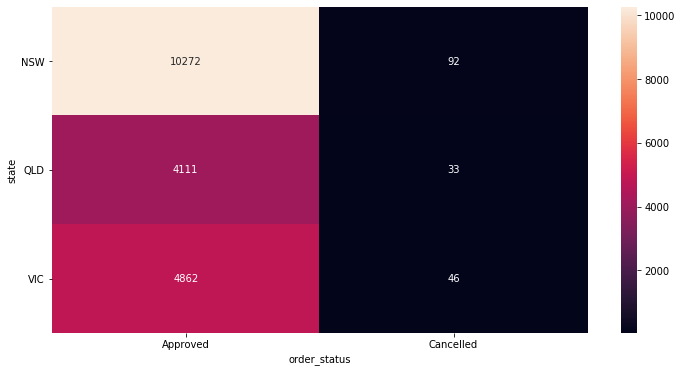

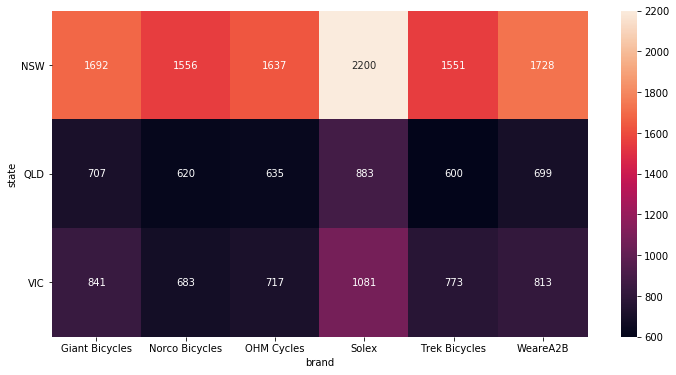

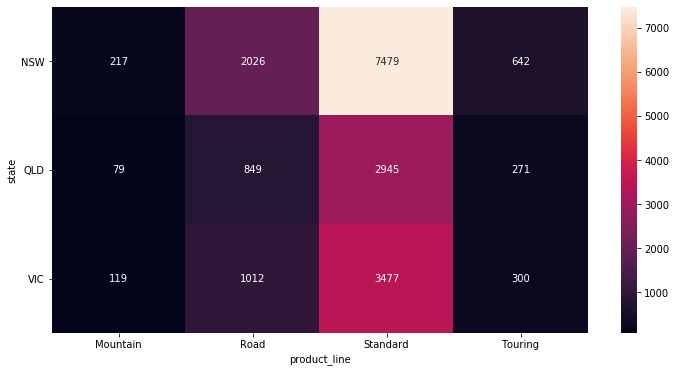

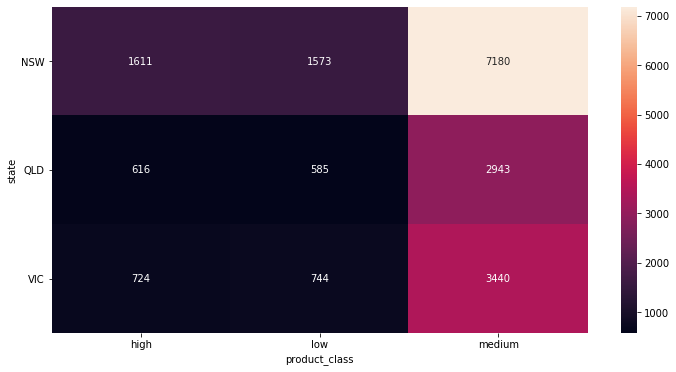

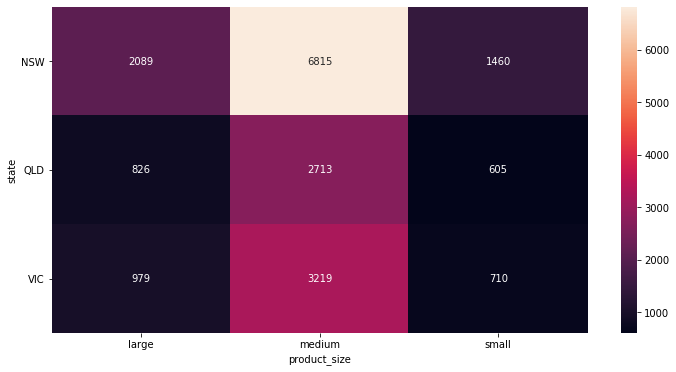

In [86]:
table_analys(df, 'state', target_cat)

In [87]:
#next(variable)

We have analysed all the independent categorical variables 

## Word Cloud formation

In [88]:
from wordcloud import WordCloud, STOPWORDS

def word_cloud(column_name):
    comment_words = ' '
    for val in df[column_name]:
        val = str(val)
        tokens = val.split()
        for i in range(len(tokens)):
            tokens[i] = tokens[i].lower()
        for words in tokens:
            comment_words = comment_words+words+' '
        
    wordcloud = WordCloud(width = 3000, height = 2000, background_color = 'black',
                          stopwords = STOPWORDS).generate(comment_words)
    fig = plt.figure(figsize = (40, 40))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

### Job Title

Job Titles


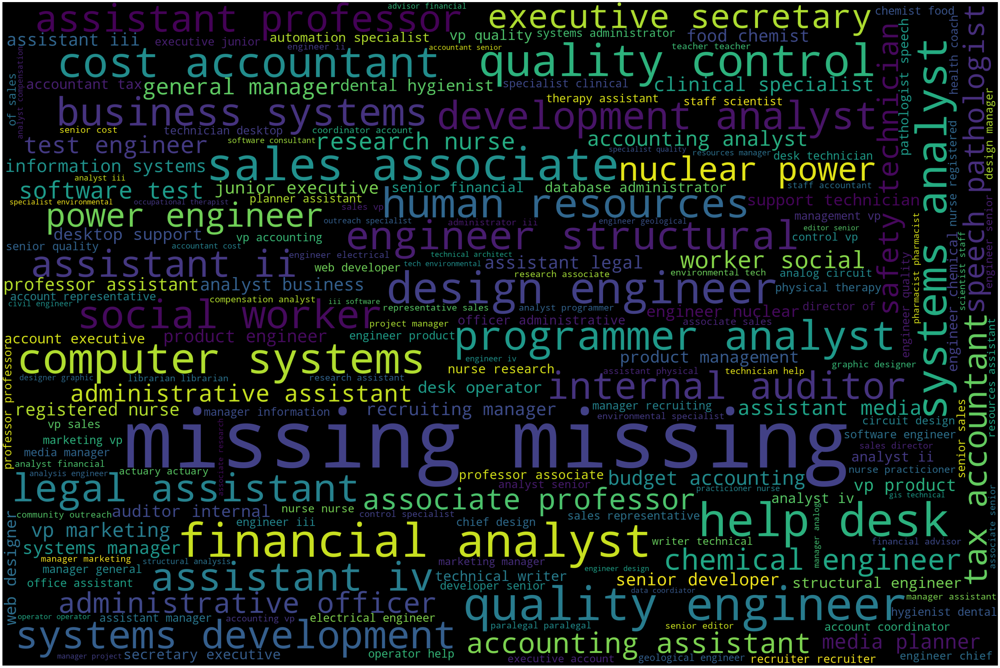

In [89]:
print('Job Titles')
word_cloud('job_title')

### Address

Address


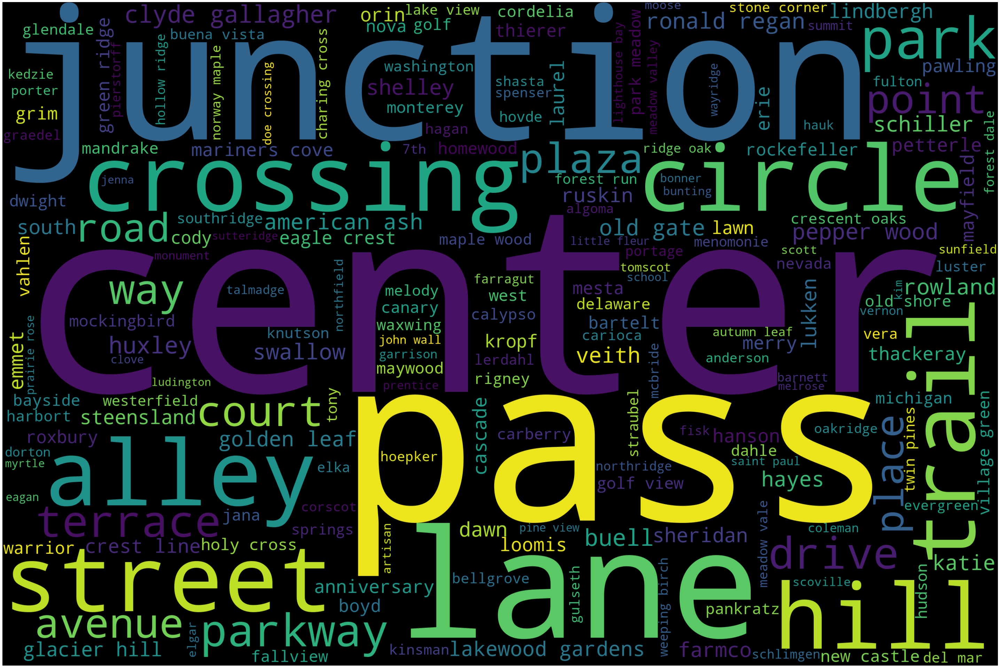

In [92]:
print('Address')
word_cloud('address')

## Feature selection 

In [93]:
independent_attribute

['first_name',
 'last_name',
 'gender',
 'past_3_years_bike_related_purchases',
 'DOB',
 'job_title',
 'job_industry_category',
 'wealth_segment',
 'deceased_indicator',
 'owns_car',
 'tenure',
 'address',
 'postcode',
 'state',
 'country',
 'property_valuation',
 'age']

In [94]:
df.reset_index(inplace=True, drop=True)

In [95]:
df.head()

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,transaction_id,product_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,address,postcode,state,country,property_valuation,birth_year,age,year,month,weekday,age_buckets_labels,age_buckets,tenure_buckets_labels,tenure_buckets,property_valuation_buckets_labels,property_valuation_buckets
0,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,94,86,2017-12-23,0.0,Approved,OHM Cycles,Standard,medium,medium,235.63,125.07,38482.0,060 Morning Avenue,2016,NSW,Australia,10,1953.0,67.0,2017,12,5,>65,"(65.0, 1000.0]",10-15,"(10.0, 15.0]",8-10,"(8.0, 10.0]"
1,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,3765,38,2017-04-06,1.0,Approved,Solex,Standard,medium,medium,1577.53,826.51,39526.0,060 Morning Avenue,2016,NSW,Australia,10,1953.0,67.0,2017,4,3,>65,"(65.0, 1000.0]",10-15,"(10.0, 15.0]",8-10,"(8.0, 10.0]"
2,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,5157,47,2017-05-11,1.0,Approved,Trek Bicycles,Road,low,small,1720.70,1531.42,37823.0,060 Morning Avenue,2016,NSW,Australia,10,1953.0,67.0,2017,5,3,>65,"(65.0, 1000.0]",10-15,"(10.0, 15.0]",8-10,"(8.0, 10.0]"
3,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,9785,72,2017-01-05,0.0,Approved,Norco Bicycles,Standard,medium,medium,360.40,270.30,37873.0,060 Morning Avenue,2016,NSW,Australia,10,1953.0,67.0,2017,1,3,>65,"(65.0, 1000.0]",10-15,"(10.0, 15.0]",8-10,"(8.0, 10.0]"
4,1,Laraine,Medendorp,F,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,13424,2,2017-02-21,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,38573.0,060 Morning Avenue,2016,NSW,Australia,10,1953.0,67.0,2017,2,1,>65,"(65.0, 1000.0]",10-15,"(10.0, 15.0]",8-10,"(8.0, 10.0]"


In [96]:
df.columns

Index(['customer_id', 'first_name', 'last_name', 'gender',
       'past_3_years_bike_related_purchases', 'DOB', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'transaction_id', 'product_id',
       'transaction_date', 'online_order', 'order_status', 'brand',
       'product_line', 'product_class', 'product_size', 'list_price',
       'standard_cost', 'product_first_sold_date', 'address', 'postcode',
       'state', 'country', 'property_valuation', 'birth_year', 'age', 'year',
       'month', 'weekday', 'age_buckets_labels', 'age_buckets',
       'tenure_buckets_labels', 'tenure_buckets',
       'property_valuation_buckets_labels', 'property_valuation_buckets'],
      dtype='object')

In [97]:
df_selected = df[['gender', 'past_3_years_bike_related_purchases', 'job_industry_category', 'wealth_segment',
                  'owns_car', 'state', 'age_buckets_labels', 'tenure_buckets_labels',
                  'property_valuation_buckets_labels']]

In [98]:
df_selected.head()

,gender,past_3_years_bike_related_purchases,job_industry_category,wealth_segment,owns_car,state,age_buckets_labels,tenure_buckets_labels,property_valuation_buckets_labels
0,F,93,Health,Mass Customer,Yes,NSW,>65,10-15,8-10
1,F,93,Health,Mass Customer,Yes,NSW,>65,10-15,8-10
2,F,93,Health,Mass Customer,Yes,NSW,>65,10-15,8-10
3,F,93,Health,Mass Customer,Yes,NSW,>65,10-15,8-10
4,F,93,Health,Mass Customer,Yes,NSW,>65,10-15,8-10


In [99]:
df_dummies = pd.get_dummies(df_selected)

In [100]:
df_dummies.shape, df_selected.shape

((19416, 39), (19416, 9))

## Model development

C:\Users\prash\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


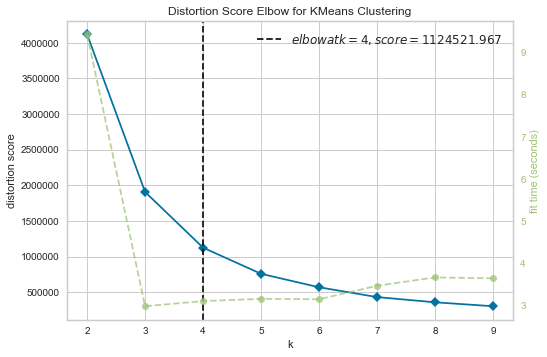

In [101]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

model = KMeans(random_state=101, verbose=1, n_jobs=-1)
visualizer = KElbowVisualizer(model, k=(2,10))
visualizer.fit(df_dummies)
visualizer.show()

In [102]:
model = KMeans(n_clusters=4, random_state=101, verbose=1, n_jobs=-1)
model.fit(df_dummies)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='auto',
       random_state=101, tol=0.0001, verbose=1)

In [103]:
model.labels_

array([2, 2, 2, ..., 0, 0, 0])

## Interpretation

In [104]:
df.columns

Index(['customer_id', 'first_name', 'last_name', 'gender',
       'past_3_years_bike_related_purchases', 'DOB', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'transaction_id', 'product_id',
       'transaction_date', 'online_order', 'order_status', 'brand',
       'product_line', 'product_class', 'product_size', 'list_price',
       'standard_cost', 'product_first_sold_date', 'address', 'postcode',
       'state', 'country', 'property_valuation', 'birth_year', 'age', 'year',
       'month', 'weekday', 'age_buckets_labels', 'age_buckets',
       'tenure_buckets_labels', 'tenure_buckets',
       'property_valuation_buckets_labels', 'property_valuation_buckets'],
      dtype='object')

In [105]:
df_final = df[['gender', 'past_3_years_bike_related_purchases', 'job_industry_category', 'wealth_segment', 'owns_car',
               'online_order', 'order_status', 'brand', 'product_line', 'product_class', 'product_size', 'list_price',
               'standard_cost', 'state', 'age_buckets_labels', 'tenure_buckets_labels', 'age', 'tenure', 'property_valuation',
               'property_valuation_buckets_labels']]

In [106]:
df_final.shape

(19416, 20)

In [107]:
df_final['group_labels'] = model.labels_

C:\Users\prash\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [108]:
df_final.shape

(19416, 21)

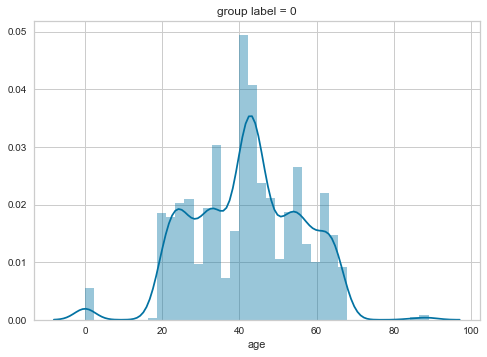

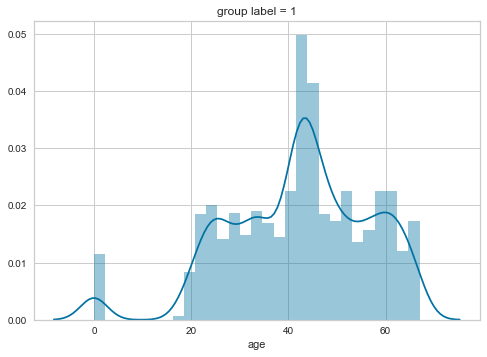

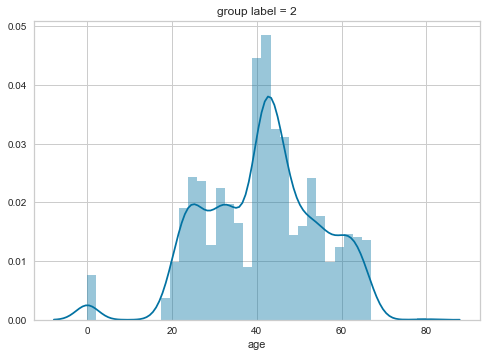

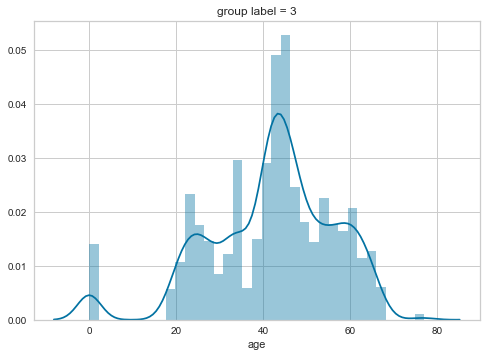

In [109]:
def eval_dist(df,col):
    for i in range(0,4):
        sns.distplot(df[df['group_labels']==i][col])
        plt.title(f'group label = {i}')
        plt.show()

eval_dist(df_final, 'age')

In [110]:
def eval_count_percent(df, col):
    for i in range(0,4):
        print(f'group label: {i}\n',
              df[df['group_labels']==i][col].value_counts()/
              len(df[df['group_labels']==i])*100,
              '\n')

eval_count_percent(df_final, 'age_buckets_labels')

group label: 0
 35-45    28.454431
45-55    19.214616
25-35    18.815624
55-65    16.400672
18-25    13.250735
>65       2.477950
0-18      1.385972
Name: age_buckets_labels, dtype: float64 

group label: 1
 35-45    27.610928
45-55    19.744236
55-65    18.213525
25-35    18.155396
18-25    10.850610
0-18      2.809533
>65       2.615772
Name: age_buckets_labels, dtype: float64 

group label: 2
 35-45    30.593297
45-55    20.063406
25-35    19.089674
55-65    14.447464
18-25    12.115036
0-18      1.856884
>65       1.834239
Name: age_buckets_labels, dtype: float64 

group label: 3
 35-45    28.579870
45-55    22.395115
55-65    17.431554
25-35    15.895214
18-25    10.911956
0-18      3.210557
>65       1.575734
Name: age_buckets_labels, dtype: float64 



In [111]:
df_final.columns

Index(['gender', 'past_3_years_bike_related_purchases',
       'job_industry_category', 'wealth_segment', 'owns_car', 'online_order',
       'order_status', 'brand', 'product_line', 'product_class',
       'product_size', 'list_price', 'standard_cost', 'state',
       'age_buckets_labels', 'tenure_buckets_labels', 'age', 'tenure',
       'property_valuation', 'property_valuation_buckets_labels',
       'group_labels'],
      dtype='object')

In [112]:
New_customer.columns

Index(['first_name', 'last_name', 'gender',
       'past_3_years_bike_related_purchases', 'DOB', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'address', 'postcode', 'state', 'country',
       'property_valuation', 'Unnamed: 16', 'Unnamed: 17', 'Unnamed: 18',
       'Unnamed: 19', 'Unnamed: 20', 'Rank', 'Value'],
      dtype='object')

In [113]:
evaluate_columns = [col for col in df_final.columns if col in New_customer.columns]
evaluate_columns

['gender',
 'past_3_years_bike_related_purchases',
 'job_industry_category',
 'wealth_segment',
 'owns_car',
 'state',
 'tenure',
 'property_valuation']

In [114]:
eval_count_percent(df_final, 'gender')

group label: 0
 F    52.078958
M    46.451071
U     1.469971
Name: gender, dtype: float64 

group label: 1
 F    51.424143
M    45.921333
U     2.654524
Name: gender, dtype: float64 

group label: 2
 M    50.430254
F    47.916667
U     1.653080
Name: gender, dtype: float64 

group label: 3
 F    48.965925
M    47.922001
U     3.112074
Name: gender, dtype: float64 



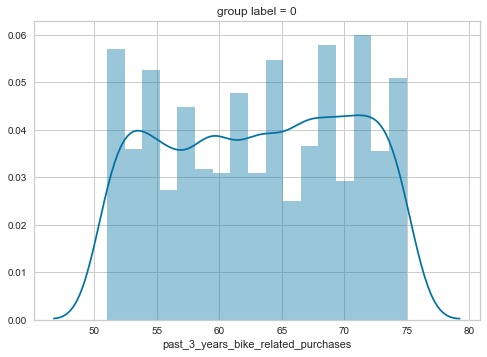

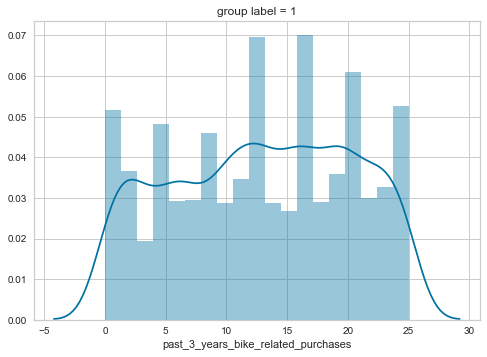

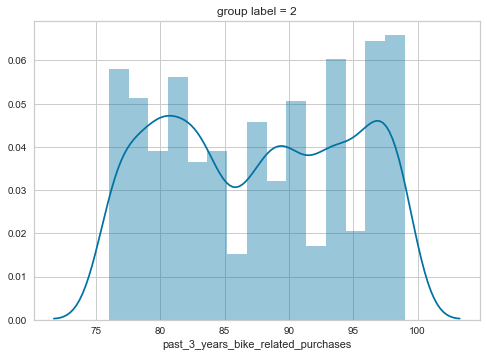

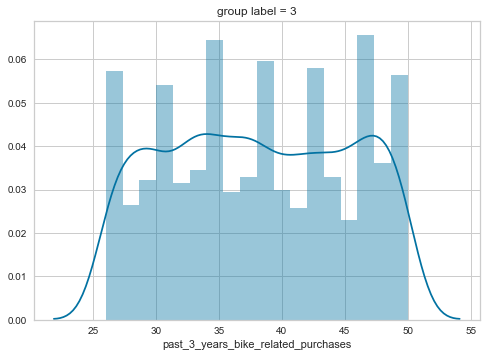

In [115]:
eval_dist(df_final, 'past_3_years_bike_related_purchases')

In [116]:
eval_count_percent(df_final, 'job_industry_category')

group label: 0
 Manufacturing         19.823604
Financial Services    17.240655
Health                17.051659
missing               16.190676
Retail                 9.848803
Property               6.404872
IT                     4.619908
Argiculture            3.821924
Entertainment          3.065939
Telecommunications     1.931961
Name: job_industry_category, dtype: float64 

group label: 1
 Financial Services    19.647355
Manufacturing         19.046696
missing               17.089711
Health                14.299554
Retail                 9.242395
IT                     6.180973
Property               5.754699
Entertainment          3.991475
Telecommunications     2.557644
Argiculture            2.189498
Name: job_industry_category, dtype: float64 

group label: 2
 Financial Services    20.584239
Manufacturing         20.176630
missing               16.938406
Health                16.281703
Retail                 7.993659
Property               6.363225
IT                     5.004

In [117]:
evaluate_columns

['gender',
 'past_3_years_bike_related_purchases',
 'job_industry_category',
 'wealth_segment',
 'owns_car',
 'state',
 'tenure',
 'property_valuation']

In [118]:
eval_count_percent(df_final, 'wealth_segment')

group label: 0
 Mass Customer        48.803024
High Net Worth       27.383452
Affluent Customer    23.813524
Name: wealth_segment, dtype: float64 

group label: 1
 Mass Customer        48.633986
High Net Worth       27.300911
Affluent Customer    24.065104
Name: wealth_segment, dtype: float64 

group label: 2
 Mass Customer        51.449275
Affluent Customer    25.928442
High Net Worth       22.622283
Name: wealth_segment, dtype: float64 

group label: 3
 Mass Customer        51.979515
High Net Worth       24.482962
Affluent Customer    23.537522
Name: wealth_segment, dtype: float64 



In [119]:
eval_count_percent(df_final, 'owns_car')

group label: 0
 Yes    51.154977
No     48.845023
Name: owns_car, dtype: float64 

group label: 1
 No     50.455338
Yes    49.544662
Name: owns_car, dtype: float64 

group label: 2
 Yes    50.724638
No     49.275362
Name: owns_car, dtype: float64 

group label: 3
 Yes    50.187118
No     49.812882
Name: owns_car, dtype: float64 



In [120]:
eval_count_percent(df_final, 'state')

group label: 0
 NSW    52.498950
VIC    23.960521
QLD    23.540529
Name: state, dtype: float64 

group label: 1
 NSW    52.761093
VIC    25.731447
QLD    21.507460
Name: state, dtype: float64 

group label: 2
 NSW    55.095109
VIC    24.003623
QLD    20.901268
Name: state, dtype: float64 

group label: 3
 NSW    53.338586
VIC    27.161710
QLD    19.499705
Name: state, dtype: float64 



In [121]:
evaluate_columns

['gender',
 'past_3_years_bike_related_purchases',
 'job_industry_category',
 'wealth_segment',
 'owns_car',
 'state',
 'tenure',
 'property_valuation']

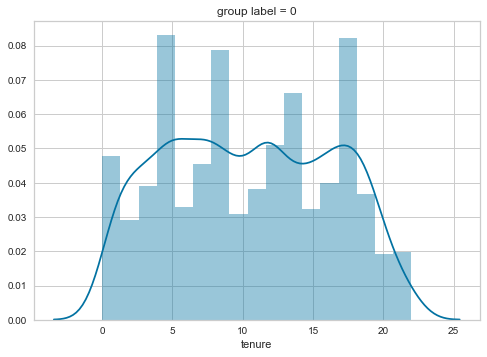

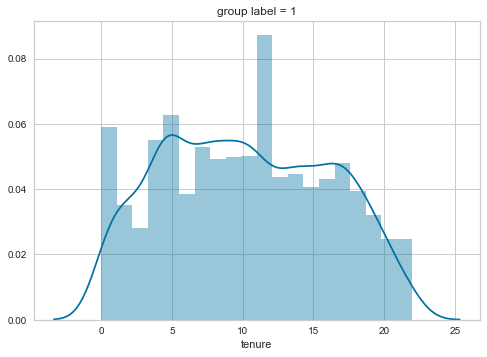

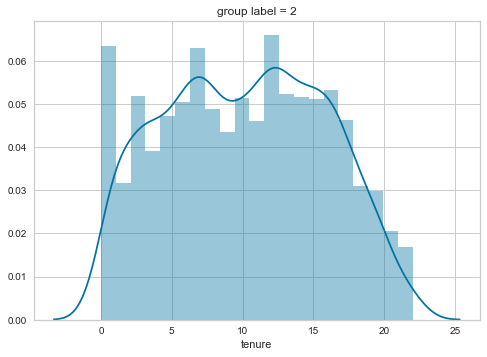

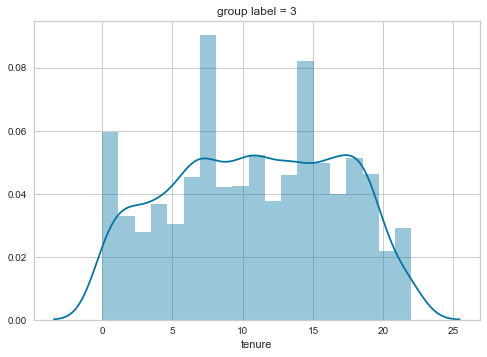

In [122]:
eval_dist(df_final, 'tenure')

In [123]:
eval_count_percent(df_final, 'tenure_buckets_labels')

group label: 0
 0-5      25.766485
5-10     24.338513
10-15    24.275514
15-20    23.057539
>20       2.561949
Name: tenure_buckets_labels, dtype: float64 

group label: 1
 5-10     26.448363
0-5      26.428987
10-15    23.774462
15-20    20.635536
>20       2.712653
Name: tenure_buckets_labels, dtype: float64 

group label: 2
 10-15    27.966486
5-10     26.924819
0-5      24.411232
15-20    18.931159
>20       1.766304
Name: tenure_buckets_labels, dtype: float64 

group label: 3
 5-10     25.507189
10-15    25.231436
15-20    24.187512
0-5      21.686035
>20       3.387827
Name: tenure_buckets_labels, dtype: float64 



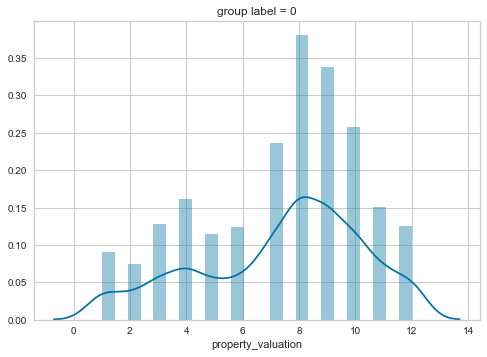

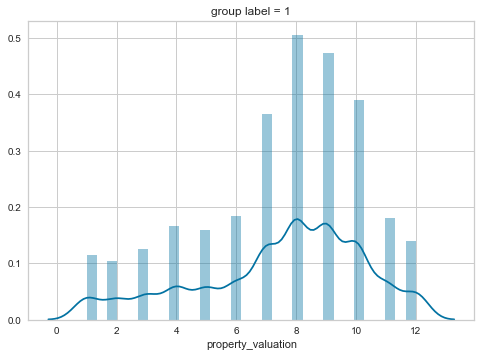

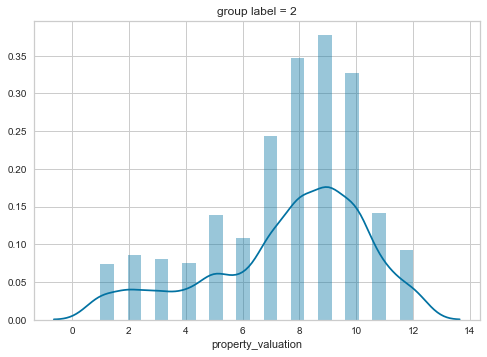

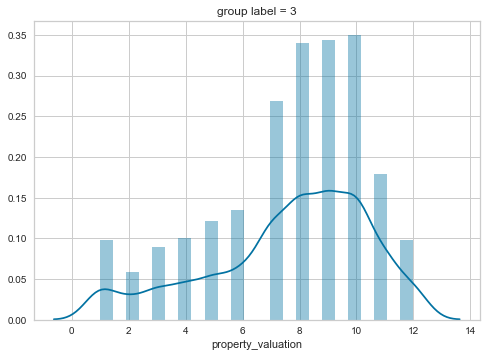

In [124]:
eval_dist(df_final, 'property_valuation')

In [125]:
eval_count_percent(df_final, 'property_valuation_buckets_labels')

group label: 0
 6-8     28.265435
8-10    27.278454
0-4     20.831583
>10     12.683746
4-6     10.940781
Name: property_valuation_buckets_labels, dtype: float64 

group label: 1
 6-8     29.955435
8-10    29.703546
0-4     17.535361
4-6     11.800039
>10     11.005619
Name: property_valuation_buckets_labels, dtype: float64 

group label: 2
 8-10    33.718297
6-8     28.238225
0-4     15.013587
4-6     11.843297
>10     11.186594
Name: property_valuation_buckets_labels, dtype: float64 

group label: 3
 8-10    31.790427
6-8     27.870790
0-4     15.855820
>10     12.724050
4-6     11.758913
Name: property_valuation_buckets_labels, dtype: float64 



In [126]:
evaluate_columns

['gender',
 'past_3_years_bike_related_purchases',
 'job_industry_category',
 'wealth_segment',
 'owns_car',
 'state',
 'tenure',
 'property_valuation']

In [127]:
evaluate_columns_left = [col for col in df_final.columns if col not in evaluate_columns]
evaluate_columns_left

['online_order',
 'order_status',
 'brand',
 'product_line',
 'product_class',
 'product_size',
 'list_price',
 'standard_cost',
 'age_buckets_labels',
 'tenure_buckets_labels',
 'age',
 'property_valuation_buckets_labels',
 'group_labels']

In [128]:
for col in ['online_order', 'brand', 'product_line', 'product_class', 'product_size']:
    eval_count_percent(df_final, col)

group label: 0
 1.0    50.335993
0.0    49.664007
Name: online_order, dtype: float64 

group label: 1
 0.0    50.125945
1.0    49.874055
Name: online_order, dtype: float64 

group label: 2
 1.0    50.203804
0.0    49.796196
Name: online_order, dtype: float64 

group label: 3
 1.0    50.049242
0.0    49.950758
Name: online_order, dtype: float64 

group label: 0
 Solex             21.650567
WeareA2B          16.610668
Giant Bicycles    16.106678
Norco Bicycles    15.455691
OHM Cycles        15.455691
Trek Bicycles     14.720706
Name: brand, dtype: float64 

group label: 1
 Solex             20.635536
Giant Bicycles    16.566557
WeareA2B          16.392172
Trek Bicycles     15.520248
OHM Cycles        15.500872
Norco Bicycles    15.384615
Name: brand, dtype: float64 

group label: 2
 Solex             21.829710
Giant Bicycles    17.595109
WeareA2B          16.666667
Trek Bicycles     15.285326
OHM Cycles        15.126812
Norco Bicycles    13.496377
Name: brand, dtype: float64 

group labe

In [129]:
def statistics(df, col_list):
    index=df[df.group_labels==0][col_list[0]].describe(percentiles=(0.25,0.5,0.75,0.9,0.99)).index
    stat=pd.DataFrame(index=index)
    for col in col_list:
        for i in range(0,4):
            values=df[df.group_labels==i][col].describe(percentiles=(0.25,0.5,0.75,0.9,0.99)).values
            stat[f'{col}_label_{i}']=values
    return stat

In [130]:
stat = statistics(df_final,['list_price','standard_cost'])

In [131]:
stat

,list_price_label_0,list_price_label_1,list_price_label_2,list_price_label_3,standard_cost_label_0,standard_cost_label_1,standard_cost_label_2,standard_cost_label_3
count,4762.00000,5161.000000,4416.000000,5077.000000,4762.000000,5161.000000,4416.000000,5077.000000
mean,1113.37281,1103.836972,1114.057543,1099.416325,564.115231,560.505437,545.657917,551.334587
std,579.21362,582.950456,582.433130,586.157023,404.386748,405.622868,402.660386,409.126758
min,12.01000,12.010000,12.010000,12.010000,7.210000,7.210000,7.210000,7.210000
25%,586.45000,575.270000,586.450000,575.270000,230.090000,230.090000,215.140000,211.370000
50%,1172.78000,1163.890000,1163.890000,1163.890000,513.850000,507.580000,459.710000,464.720000
75%,1635.30000,1577.530000,1635.300000,1577.530000,818.010000,795.100000,778.690000,795.100000
90%,1842.92000,1873.970000,1873.970000,1873.970000,1105.750000,1105.750000,1082.360000,1105.750000
99%,2091.47000,2091.470000,2091.470000,2091.470000,1610.900000,1670.480000,1759.850000,1759.850000
max,2091.47000,2091.470000,2091.470000,2091.470000,1759.850000,1759.850000,1759.850000,1759.850000


In [126]:
stat.loc[['count','mean','std']]

,list_price_label_0,list_price_label_1,list_price_label_2,list_price_label_3,standard_cost_label_0,standard_cost_label_1,standard_cost_label_2,standard_cost_label_3
count,4762.00000,5161.000000,4416.000000,5077.000000,4762.000000,5161.000000,4416.000000,5077.000000
mean,1113.37281,1103.836972,1114.057543,1099.416325,564.115231,560.505437,545.657917,551.334587
std,579.21362,582.950456,582.433130,586.157023,404.386748,405.622868,402.660386,409.126758


In [133]:
df_final.property_valuation_buckets_labels

0        8-10
1        8-10
2        8-10
3        8-10
4        8-10
5        8-10
6        8-10
7        8-10
8        8-10
9        8-10
10       8-10
11       8-10
12       8-10
13       8-10
14       8-10
15       8-10
16        0-4
17        0-4
18        0-4
19        0-4
20        0-4
21        0-4
22       8-10
23       8-10
24       8-10
25       8-10
26       8-10
27       8-10
28       8-10
29       8-10
30        0-4
31        0-4
32        0-4
33        0-4
34        0-4
35        0-4
36        0-4
37        0-4
38        0-4
39        >10
40        >10
41        >10
42        >10
43        >10
44        >10
45        6-8
46        6-8
47        6-8
48        6-8
49        6-8
50        0-4
51        0-4
52        0-4
53        0-4
54        0-4
55        0-4
56        0-4
57        4-6
58        4-6
59        4-6
60        4-6
61        4-6
62        4-6
63        4-6
64        6-8
65        6-8
66        6-8
67       8-10
68       8-10
69       8-10
70       8-10
71    

### Preprocessing the New Customer dataset to labels them in a group

In [136]:
New_customer.columns

Index(['first_name', 'last_name', 'gender',
       'past_3_years_bike_related_purchases', 'DOB', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'address', 'postcode', 'state', 'country',
       'property_valuation', 'Unnamed: 16', 'Unnamed: 17', 'Unnamed: 18',
       'Unnamed: 19', 'Unnamed: 20', 'Rank', 'Value'],
      dtype='object')

In [137]:
new_customers = New_customer.drop(['first_name', 'last_name', 'job_title', 'deceased_indicator', 'address', 'postcode',
                                  'country', 'Unnamed: 16', 'Unnamed: 17', 'Unnamed: 18','Unnamed: 19', 'Unnamed: 20',
                                   'Rank', 'Value'], axis=1)
new_customers.columns

Index(['gender', 'past_3_years_bike_related_purchases', 'DOB',
       'job_industry_category', 'wealth_segment', 'owns_car', 'tenure',
       'state', 'property_valuation'],
      dtype='object')

In [138]:
new_customers.isnull().any()

gender                                 False
past_3_years_bike_related_purchases    False
DOB                                     True
job_industry_category                   True
wealth_segment                         False
owns_car                               False
tenure                                 False
state                                  False
property_valuation                     False
dtype: bool

In [139]:
new_customers.job_industry_category = new_customers.job_industry_category.fillna('missing')
new_customers.job_industry_category.unique()

array(['Manufacturing', 'Property', 'Financial Services', 'Entertainment',
       'Retail', 'IT', 'Telecommunications', 'Health', 'missing',
       'Argiculture'], dtype=object)

In [140]:
for var in ['gender', 'job_industry_category', 'wealth_segment', 'owns_car', 'state']:
    print(var,'\n',new_customers[var].unique(),'\n')

gender 
 ['Male' 'Female' 'U'] 

job_industry_category 
 ['Manufacturing' 'Property' 'Financial Services' 'Entertainment' 'Retail'
 'IT' 'Telecommunications' 'Health' 'missing' 'Argiculture'] 

wealth_segment 
 ['Mass Customer' 'Affluent Customer' 'High Net Worth'] 

owns_car 
 ['Yes' 'No'] 

state 
 ['QLD' 'NSW' 'VIC'] 



In [141]:
for var in ['gender', 'job_industry_category', 'wealth_segment', 'owns_car', 'state']:
    print(var,'\n',df_selected[var].unique(),'\n')

gender 
 ['F' 'M' 'U'] 

job_industry_category 
 ['Health' 'Financial Services' 'IT' 'missing' 'Retail' 'Argiculture'
 'Property' 'Manufacturing' 'Telecommunications' 'Entertainment'] 

wealth_segment 
 ['Mass Customer' 'Affluent Customer' 'High Net Worth'] 

owns_car 
 ['Yes' 'No'] 

state 
 ['NSW' 'QLD' 'VIC'] 



In [142]:
new_customers.gender = new_customers.gender.map({'Male':'M', 'Female':'F', 'U':'U'})
new_customers.gender.unique()

array(['M', 'F', 'U'], dtype=object)

In [143]:
def age(df, col):
    X=df.copy()
    X['year']=pd.DatetimeIndex(X[col]).year
    df['age'] = 2020-X['year']
    return df['age']

In [144]:
age(new_customers, 'DOB')

0      63.0
1      50.0
2      46.0
3      41.0
4      55.0
5      69.0
6      44.0
7      48.0
8      48.0
9      35.0
10     25.0
11     21.0
12     30.0
13     44.0
14     56.0
15     66.0
16     27.0
17     44.0
18     82.0
19     66.0
20     52.0
21     27.0
22     22.0
23     43.0
24     38.0
25     75.0
26     68.0
27     54.0
28     60.0
29     60.0
30     40.0
31     69.0
32     33.0
33     39.0
34     43.0
35     45.0
36     52.0
37     41.0
38     65.0
39     27.0
40     67.0
41     35.0
42     74.0
43     54.0
44     59.0
45     64.0
46     64.0
47     26.0
48     43.0
49     70.0
50     42.0
51     21.0
52     27.0
53     39.0
54     25.0
55     39.0
56     41.0
57     48.0
58     54.0
59      NaN
60     37.0
61     49.0
62     78.0
63     53.0
64     21.0
65     37.0
66     24.0
67     36.0
68     21.0
69     32.0
70     24.0
71     26.0
72     21.0
73     52.0
74     62.0
75     46.0
76     59.0
77     64.0
78     48.0
79     47.0
80     25.0
81     55.0
82     39.0
83  

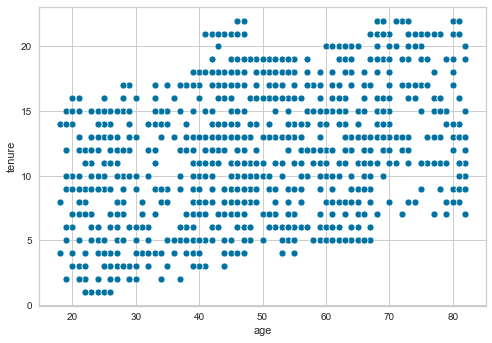

In [145]:
sns.scatterplot(new_customers.age, new_customers.tenure)

In [146]:
new_customers.age.isnull().sum()

17

In [147]:
list1=new_customers.groupby('tenure')['age'].mean().index
list2=new_customers.groupby('tenure')['age'].mean().values.round()

for tenure_, mean_age in zip(list1, list2):
    index = new_customers[(new_customers.tenure==tenure_) & (new_customers.age.isnull())].index
    if np.isnan(mean_age):
        new_customers.loc[index,'age']=0
    else:
        new_customers.loc[index,'age']=int(mean_age)
    print(new_customers.age.isnull().sum())

15
15
13
12
11
8
8
7
7
7
7
5
4
3
1
0
0
0
0
0
0
0
0


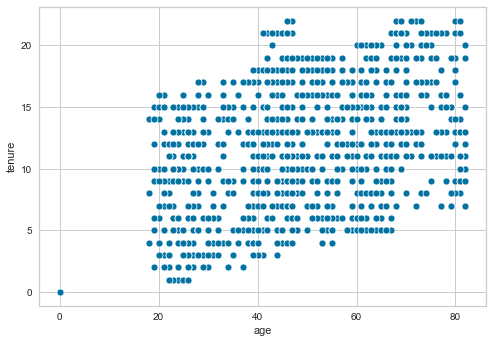

In [148]:
sns.scatterplot(new_customers.age, new_customers.tenure)

Creating age tenure and property_valuation buckets

In [149]:
def buckets(df):
    df['age_buckets_labels'] = pd.cut(df['age'], bins=age_buckets, labels=age_labels, include_lowest=True)
    df['tenure_buckets_labels'] = pd.cut(df['tenure'], bins=tenure_buckets, labels=tenure_labels, include_lowest=True)
    df['property_valuation_buckets_labels'] = pd.cut(df['property_valuation'], bins=property_valuation_buckets,
                                                     labels=property_valuation_labels, include_lowest=True)
    
buckets(new_customers)

In [150]:
new_customers[['age_buckets_labels', 'tenure_buckets_labels', 'property_valuation_buckets_labels']].head()

,age_buckets_labels,tenure_buckets_labels,property_valuation_buckets_labels
0,55-65,10-15,4-6
1,45-55,15-20,>10
2,45-55,5-10,4-6
3,35-45,0-5,0-4
4,45-55,15-20,8-10


In [151]:
new_customers.drop(['age', 'tenure', 'property_valuation', 'DOB'], axis=1, inplace=True)

In [152]:
new_customers.isnull().any()

gender                                 False
past_3_years_bike_related_purchases    False
job_industry_category                  False
wealth_segment                         False
owns_car                               False
state                                  False
age_buckets_labels                     False
tenure_buckets_labels                  False
property_valuation_buckets_labels      False
dtype: bool

In [153]:
new_customers_dummies = pd.get_dummies(new_customers)

In [154]:
new_customers.shape, new_customers_dummies.shape

((1000, 9), (1000, 39))

# Grouping new customers into 4 sets

In [155]:
model.predict(new_customers_dummies)

array([2, 0, 1, 0, 3, 3, 1, 0, 3, 0, 2, 3, 0, 3, 3, 2, 0, 2, 0, 1, 1, 3,
       3, 1, 2, 1, 1, 0, 2, 3, 0, 0, 2, 0, 3, 3, 2, 0, 3, 0, 0, 1, 2, 0,
       2, 3, 1, 2, 0, 1, 0, 0, 0, 2, 2, 0, 0, 0, 0, 1, 3, 3, 0, 0, 1, 0,
       0, 0, 0, 2, 1, 2, 0, 1, 2, 2, 1, 3, 1, 1, 0, 3, 1, 0, 3, 1, 1, 1,
       3, 1, 2, 3, 2, 2, 1, 2, 1, 0, 3, 3, 2, 0, 1, 0, 0, 3, 1, 1, 2, 1,
       2, 3, 0, 1, 0, 3, 0, 1, 3, 1, 0, 0, 2, 1, 3, 0, 0, 1, 3, 0, 2, 3,
       1, 3, 3, 2, 2, 3, 1, 0, 2, 1, 3, 1, 1, 3, 2, 3, 0, 3, 0, 3, 0, 0,
       1, 0, 2, 1, 1, 3, 3, 1, 0, 2, 1, 0, 0, 0, 2, 3, 3, 3, 0, 0, 0, 0,
       2, 0, 2, 0, 3, 2, 3, 3, 0, 0, 3, 0, 1, 0, 3, 0, 1, 3, 3, 1, 0, 0,
       3, 0, 0, 2, 3, 3, 1, 1, 3, 0, 1, 2, 3, 2, 1, 3, 1, 1, 3, 1, 2, 1,
       0, 0, 0, 0, 2, 1, 3, 0, 3, 3, 0, 3, 2, 0, 1, 3, 2, 3, 2, 1, 1, 2,
       0, 3, 1, 1, 0, 3, 0, 0, 2, 2, 1, 2, 0, 1, 3, 3, 3, 3, 1, 1, 2, 3,
       0, 0, 2, 2, 0, 2, 2, 0, 2, 3, 3, 2, 0, 3, 0, 2, 1, 3, 3, 2, 2, 1,
       0, 1, 2, 3, 2, 1, 2, 2, 3, 0, 0, 2, 2, 0, 3,

In [156]:
new_customers['group_labels'] = model.predict(new_customers_dummies)
new_customers.head()

,gender,past_3_years_bike_related_purchases,job_industry_category,wealth_segment,owns_car,state,age_buckets_labels,tenure_buckets_labels,property_valuation_buckets_labels,group_labels
0,M,86,Manufacturing,Mass Customer,Yes,QLD,55-65,10-15,4-6,2
1,M,69,Property,Mass Customer,No,NSW,45-55,15-20,>10,0
2,F,10,Financial Services,Affluent Customer,No,VIC,45-55,5-10,4-6,1
3,F,64,Manufacturing,Affluent Customer,Yes,QLD,35-45,0-5,0-4,0
4,F,34,Financial Services,Affluent Customer,No,NSW,45-55,15-20,8-10,3


In [157]:
round(df_final[df_final['group_labels']==0]['online_order'].value_counts()/
      len(df_final[df_final['group_labels']==0])*
      len(new_customers[new_customers['group_labels']==0]))

1.0    146.0
0.0    145.0
Name: online_order, dtype: float64

In [158]:
def Expected_no_of_customers(new_df, col, trained_df):
    print('EXPECTED NUMBER OF CUSTOMERS BASED ON GROUPS AND ATTRIBUTES')
    for i in range(0,4):
        print(f'Attribute: {col} group label: {i}\n',
              round(trained_df[trained_df['group_labels']==i][col].value_counts()/
                    len(trained_df[trained_df['group_labels']==i])*
                    len(new_df[new_df['group_labels']==i])),
              '\n')

for col in ['online_order', 'brand', 'product_line', 'product_class', 'product_size']:
    Expected_no_of_customers(new_customers, col, df_final)

EXPECTED NUMBER OF CUSTOMERS BASED ON GROUPS AND ATTRIBUTES
Attribute: online_order group label: 0
 1.0    146.0
0.0    145.0
Name: online_order, dtype: float64 

Attribute: online_order group label: 1
 0.0    121.0
1.0    120.0
Name: online_order, dtype: float64 

Attribute: online_order group label: 2
 1.0    107.0
0.0    106.0
Name: online_order, dtype: float64 

Attribute: online_order group label: 3
 1.0    128.0
0.0    127.0
Name: online_order, dtype: float64 

EXPECTED NUMBER OF CUSTOMERS BASED ON GROUPS AND ATTRIBUTES
Attribute: brand group label: 0
 Solex             63.0
WeareA2B          48.0
Giant Bicycles    47.0
Norco Bicycles    45.0
OHM Cycles        45.0
Trek Bicycles     43.0
Name: brand, dtype: float64 

Attribute: brand group label: 1
 Solex             50.0
Giant Bicycles    40.0
WeareA2B          40.0
Trek Bicycles     37.0
OHM Cycles        37.0
Norco Bicycles    37.0
Name: brand, dtype: float64 

Attribute: brand group label: 2
 Solex             46.0
Giant Bicy

In [161]:
with pd.ExcelWriter('data_insights.xlsx') as writer:  
    df_final.to_excel(writer, sheet_name='df_final', index=False)
    new_customers.to_excel(writer, sheet_name='new_customers', index=False)